# COF Extreme Precipitation Rain-Type Rank Map

## Purpose
This notebook analyzes the contributions of 13 co-occurrence feature (COF) precipitation types to **extreme precipitation** across multiple observational and global storm-resolving model (GSRM) sources. It identifies the spatially dominant precipitation types at each grid cell for a chosen extreme percentile threshold (e.g., p95 or p90) and produces both global maps and regional pie-chart summaries for comparison across datasets.

## Input Data
Extreme precipitation spatial statistics on a HEALPix zoom 8 grid, one NetCDF file per source:
```
/pscratch/sd/w/wcmca1/hackathon/extreme_precip/<source>_stormtype_spatial_<extreme_percentile>*.nc
```
These files are generated by:
- **Python script:** `waccem/gsrm_cooccurrencefeature/scripts/calc_stormtype_extreme_precip_spatial.py`
- **Bash script** (processes all sources): `waccem/gsrm_cooccurrencefeature/scripts/run_stormtype_extreme_precip.sh`

**Extreme percentile:** `p95` (default) or `p90` — set via `extreme_percentile` variable in the config cell

**Sources:** OBS (IMERGv7), SCREAM (m1), ICON (m2), NICAM (m3), UM (m4), CASESM2 (m5)

**Land mask:** HEALPix topography/land-fraction file from SCREAM (`scream2D_hrly_topo_hp8_v7.zarr`)

## Precipitation Types (13 categories)
| # | Type | Description |
|---|------|-------------|
| 1 | MCS | Isolated MCS |
| 2 | AR | Isolated AR |
| 3 | ETC | Isolated ETC |
| 4 | TC | Tropical cyclone |
| 5 | MCS-AR | MCS co-occurring with AR |
| 6 | MCS-ETC | MCS co-occurring with ETC |
| 7 | AR-ETC | AR co-occurring with ETC |
| 8 | MCS-AR-ETC | MCS + AR + ETC co-occurrence |
| 9 | DC | Deep convection (untracked) |
| 10 | ND | Non-deep convection (untracked) |
| 11 | ST | Stratiform (untracked) |
| 12 | DZ | Drizzle (untracked) |
| 13 | Residual | Precipitation not attributed to any type |

## Analysis Steps
1. **Load & combine** all source files into a single `xarray.Dataset` with a `source` dimension; filter out polar latitudes (> 60°N/S)
2. **Compute extreme precipitation fractions** for each of the 13 types relative to total extreme precipitation
3. **Separate land / ocean** using a land-fraction threshold (≥ 90% for land, < 90% for ocean)
4. **Subset by region**: Tropics (20°S–20°N), N. Hemisphere extratropics (20–60°N), S. Hemisphere extratropics (20–60°S)
5. **Rank dominant types** per grid cell (top-1, top-2, top-3) using `get_ranked_precip_types()`
6. **Compute area-mean fractions** per region × land/ocean × source

## Plots Generated
| Figure | Description | Output File |
|--------|-------------|-------------|
| Global rank-1 map | Fraction of extreme precip contributed by the single largest type per cell (6-panel, one per source) | `globalmap_precip_rank1_frac_annual_<percentile>.pdf` |
| Global rank-2 map | Fraction contributed by the second-largest type per cell | `globalmap_precip_rank2_frac_annual_<percentile>.pdf` |
| Top-2 combined map | Combined fraction of the top 2 types | `globalmap_precip_rank12_frac_annual_<percentile>.pdf` |
| Top-3 combined map | Combined fraction of the top 3 types | `globalmap_precip_rank123_frac_annual_<percentile>.pdf` |
| Dominant type map | Categorical map of the rank-1 precipitation type colored by category | `globalmap_precip_domtype_annual_<percentile>.pdf` |
| 6×6 pie-chart summary | Regional pie charts (Land/Ocean × Tropics/N.H./S.H.) for all 6 sources in a single figure | `PieChart_StormType_Fraction_<PERCENTILE>_6x6_combined.pdf` |

Output figures are saved to: `/global/cfs/cdirs/m1867/zfeng/hk25/figures_cof_extremerain/`


In [1]:
import glob
import numpy as np
import xarray as xr
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cf
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import matplotlib.gridspec as gridspec
import matplotlib.colors as colors
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Patch
import copy, os
import colormaps as cmaps
import easygems.healpix as egh

In [2]:
extreme_percentile = 'p95'
# extreme_percentile = 'p90'

rootdir = '/pscratch/sd/w/wcmca1/hackathon/extreme_precip/'
name_map = {
    'obs': 'IMERGv7',
    'm1': 'scream',
    'm2': 'icon_d3hp003',
    'm3': 'nicam_gl11',
    'm4': 'um_glm_n2560_RAL3p3',
    'm5': 'casesm2_10km_nocumulus',
}
name_map_plot = {
    'obs': 'OBS',
    'm1': 'SCREAM',
    'm2': 'ICON',
    'm3': 'NICAM',
    'm4': 'UM',
    'm5': 'CASESM2',
}

# Input filenames
filenames = {key:glob.glob(f"{rootdir}/{value}_stormtype_spatial_{extreme_percentile}*.nc")[0] for key,value in name_map.items()}

landmaskfile = '/global/cfs/cdirs/m4581/gsharing/hackathon/scream-cess-healpix/scream2D_hrly_topo_hp8_v7.zarr'

figdir = '/global/cfs/cdirs/m1867/zfeng/hk25/figures_cof_extremerain/'
os.makedirs(figdir, exist_ok=True)
print(figdir)

/global/cfs/cdirs/m1867/zfeng/hk25/figures_cof_extremerain/


### Check if input files exist

In [3]:
for key, value in filenames.items():
    print(f'{value}: {os.path.isfile(value)}')

/pscratch/sd/w/wcmca1/hackathon/extreme_precip/IMERGv7_stormtype_spatial_p95.nc: True
/pscratch/sd/w/wcmca1/hackathon/extreme_precip/scream_stormtype_spatial_p95.nc: True
/pscratch/sd/w/wcmca1/hackathon/extreme_precip/icon_d3hp003_stormtype_spatial_p95.nc: True
/pscratch/sd/w/wcmca1/hackathon/extreme_precip/nicam_gl11_stormtype_spatial_p95.nc: True
/pscratch/sd/w/wcmca1/hackathon/extreme_precip/um_glm_n2560_RAL3p3_stormtype_spatial_p95.nc: True
/pscratch/sd/w/wcmca1/hackathon/extreme_precip/casesm2_10km_nocumulus_stormtype_spatial_p95.nc: True


In [4]:
# Read in landmask file
dstop = xr.open_dataset(landmaskfile)
ter = dstop.ELEV
landfrac = dstop.LANDFRAC
dstop

<xarray.Dataset> Size: 13MB
Dimensions:   (cell: 786432, crs: 0)
Coordinates:
  * crs       (crs) float64 0B 
Dimensions without coordinates: cell
Data variables:
    ELEV      (cell) float32 3MB ...
    LANDFRAC  (cell) float32 3MB ...
    lat       (cell) float32 3MB ...
    lon       (cell) float32 3MB ...
Attributes:
    NCO:                        netCDF Operators version 4.9.8-alpha01 (Homep...
    history:                    Fri Jun 11 12:26:48 2021: ncks -A USGS-gtopo3...
    history_of_appended_files:  Fri Jun 11 12:26:48 2021: Appended file USGS-...
    source:                     USGS 30-sec dataset binned to ncube3000 (cube...
    title:                      30-second USGS topo data

<Figure size 640x480 with 0 Axes>

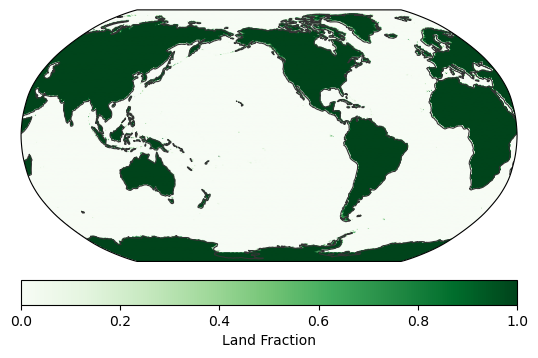

In [5]:
im = egh.healpix_show(landfrac, cmap='Greens', vmin=0, vmax=1)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Land Fraction')

### Helper function to standardize lat/lon coordinates

When combining files from different sources, lat/lon coordinates may have different orderings even though they use the same HEALPix grid. This causes xarray to create 2D coordinates `(source, cell)` instead of 1D `(cell)`.

Solution: Use a reference landmask file to provide standardized lat/lon coordinates for all sources.

In [6]:
def standardize_healpix_coords(ds, reference_lat, reference_lon):
    """
    Replace lat/lon coordinates with standardized reference coordinates.
    
    This fixes the issue where different sources have the same HEALPix cells
    but with different lat/lon orderings, causing xarray to create 2D 
    coordinates (source, cell) instead of 1D (cell) when combining datasets.
    
    Parameters:
    -----------
    ds : xr.Dataset
        Dataset with lat/lon coordinates that may be in different order
    reference_lat : xr.DataArray
        Reference latitude coordinate (cell,)
    reference_lon : xr.DataArray
        Reference longitude coordinate (cell,)
    
    Returns:
    --------
    xr.Dataset with standardized lat/lon coordinates
    """
    # Drop existing lat/lon coordinates
    ds = ds.drop_vars(['lat', 'lon'], errors='ignore')
    
    # Assign standard coordinates
    ds = ds.assign_coords({
        'lat': reference_lat,
        'lon': reference_lon
    })
    
    return ds


# Load reference coordinates from landmask file
print("Loading reference HEALPix coordinates from landmask file...")
ds_ref = xr.open_dataset(landmaskfile)
reference_lat = ds_ref.lat
reference_lon = ds_ref.lon
print(f"✅ Reference coordinates loaded: {len(reference_lat)} cells")

Loading reference HEALPix coordinates from landmask file...
✅ Reference coordinates loaded: 786432 cells


## Issue: 2D lat/lon coordinates when combining sources

**Problem:** When combining multiple NetCDF files from different sources using `xr.open_mfdataset()`, the lat/lon coordinates become 2D `(source, cell)` instead of 1D `(cell)`.

**Root Cause:** Different sources have the same HEALPix cells but with **different orderings** of lat/lon values. Even though they use the same HEALPix zoom 8 grid (786,432 cells), the cell-to-coordinate mapping differs between sources due to different processing paths.

**Why this happens:**
- Each source processes data through different tools (IMERG, SCREAM, ICON, etc.)
- The `egh.attach_coords()` function may apply coordinates differently depending on data source
- While sorted lat/lon values are identical, the **ordering** per cell index differs
- xarray detects this mismatch and promotes lat/lon to 2D to preserve all variations

**Solutions implemented:**

1. **In Python script (`calc_stormtype_extreme_precip_spatial.py`):**
   - Use mask dataset's lat/lon (line 589-591) instead of precipitation dataset
   - Mask coordinates are standardized since all masks were created with the same code
   - Prevents the issue at the source

2. **In notebook (this file):**
   - Use `standardize_healpix_coords()` function to replace lat/lon with reference coordinates
   - Reference coordinates loaded from landmask file
   - Apply before combining datasets with `xr.concat()`

**Why NOT to use `ds.pipe(egh.attach_coords)`:**
- This recomputes coordinates from cell indices
- May not match the original file's coordinates exactly
- Can cause filtering issues (as user observed) due to slight numerical differences
- Better to use a consistent reference instead

## Read and combine all sources to a single DataSet

**Important:** When combining sources, we standardize lat/lon coordinates using a reference to ensure they remain 1D `(cell)` rather than becoming 2D `(source, cell)`. See explanation cells above for details.

In [7]:
drop_vars = []
# Read and standardize each file individually, then combine
print("Reading and standardizing coordinates for each source...")
datasets = []
for key, filepath in filenames.items():
    print(f"  {key}: {os.path.basename(filepath)}")
    ds_single = xr.open_dataset(filepath, drop_variables=drop_vars)
    # Standardize lat/lon coordinates to match reference
    ds_single = standardize_healpix_coords(ds_single, reference_lat, reference_lon)
    datasets.append(ds_single)

# Combine with source dimension
ds = xr.concat(datasets, dim='source')
# Assign new coordinate 'source' using name_map dictionary keys
ds['source'] = list(name_map.keys())

# Load lat/lon coordinates in memory
hp_lat = ds.lat.load()
hp_lon = ds.lon.load()

print(f"\n✅ Combined dataset:")
print(f"   Sources: {list(ds.source.values)}")
print(f"   Lat dimensions: {ds.lat.dims}, shape: {ds.lat.shape}")
print(f"   Lon dimensions: {ds.lon.dims}, shape: {ds.lon.shape}")
ds

Reading and standardizing coordinates for each source...
  obs: IMERGv7_stormtype_spatial_p95.nc
  m1: scream_stormtype_spatial_p95.nc
  m2: icon_d3hp003_stormtype_spatial_p95.nc
  m3: nicam_gl11_stormtype_spatial_p95.nc
  m4: um_glm_n2560_RAL3p3_stormtype_spatial_p95.nc
  m5: casesm2_10km_nocumulus_stormtype_spatial_p95.nc

✅ Combined dataset:
   Sources: [np.str_('obs'), np.str_('m1'), np.str_('m2'), np.str_('m3'), np.str_('m4'), np.str_('m5')]
   Lat dimensions: ('cell',), shape: (786432,)
   Lon dimensions: ('cell',), shape: (786432,)


<xarray.Dataset> Size: 541MB
Dimensions:                (source: 6, cell: 786432)
Coordinates:
    time                   (source) datetime64[ns] 48B 2019-08-01 ... 2020-03...
    crs                    int64 8B 0
  * cell                   (cell) int64 6MB 0 1 2 3 ... 786429 786430 786431
    lat                    (cell) float32 3MB 0.1492 0.2984 ... -0.2984 -0.1492
    lon                    (cell) float32 3MB 45.02 45.2 44.85 ... 314.8 315.0
    lev                    float64 8B 0.0
  * source                 (source) <U3 72B 'obs' 'm1' 'm2' 'm3' 'm4' 'm5'
Data variables: (12/28)
    total_extreme_count    (source, cell) int32 19MB 7 7 8 7 7 ... 21 21 21 21
    total_extreme_precip   (source, cell) float32 19MB 30.82 37.05 ... 158.4
    mcs_isolated_count     (source, cell) int32 19MB 6 7 6 7 7 ... 16 15 16 16
    mcs_isolated_frac      (source, cell) float32 19MB 0.9233 1.0 ... 0.752
    ar_isolated_count      (source, cell) int32 19MB 0 0 0 0 0 0 ... 0 0 0 0 0 0
    ar_isolated_frac       (source, cell) float32 19MB 0.0 0.0 0.0 ... 0.0 0.0
    ...                     ...
    st_count               (source, cell) int32 19MB 1 0 0 0 0 0 ... 0 0 0 0 0 0
    st_frac                (source, cell) float32 19MB 0.07667 0.0 ... 0.0 0.0
    dz_count               (source, cell) int32 19MB 0 0 0 0 0 0 ... 0 0 0 0 0 0
    dz_frac                (source, cell) float32 19MB 0.0 0.0 0.0 ... 0.0 0.0
    unassigned_count       (source, cell) int32 19MB 0 0 0 0 0 0 ... 9 7 5 6 5 5
    unassigned_frac        (source, cell) float32 19MB 0.0 0.0 ... 0.2271 0.248
Attributes:
    title:             Spatial storm type attribution for P95 extreme precipi...
    percentile:        P95
    description:       Per-cell counts of extreme precipitation by storm type...
    ntimes_processed:  1588
    source_name:       IMERGv7
    start_date:        2019-08-01
    end_date:          2020-08-31
    created_on:        Wed Mar  4 22:08:51 2026
    contact:           Zhe Feng, zhe.feng@pnnl.gov

### Verify standardization worked

In [8]:
# Test that coordinates are now 1D
print(f"Lat dimensions: {hp_lat.dims}")
print(f"Lon dimensions: {hp_lon.dims}")
print(f"Lat shape: {hp_lat.shape}")
print(f"Lon shape: {hp_lon.shape}")

# Test that filtering by latitude works correctly
test_lat_range = (-60, 60)
lat_mask = (hp_lat >= test_lat_range[0]) & (hp_lat <= test_lat_range[1])
n_cells_in_range = lat_mask.sum().values
print(f"\nCells in latitude range {test_lat_range}: {n_cells_in_range:,}")
print(f"Total cells: {len(hp_lat):,}")
print(f"Fraction in range: {100*n_cells_in_range/len(hp_lat):.1f}%")

Lat dimensions: ('cell',)
Lon dimensions: ('cell',)
Lat shape: (786432,)
Lon shape: (786432,)

Cells in latitude range (-60, 60): 680,808
Total cells: 786,432
Fraction in range: 86.6%


In [9]:
ds.total_extreme_precip.attrs

{'long_name': 'Total extreme precipitation amount',
 'units': 'mm/h',
 'percentile': 'P95',
 'description': 'Sum of precipitation where pr > threshold across all time steps'}

## Filter DataSet in the Polar Region (No coherent storm types in polar region)

In [10]:
polar_lat = 60

ds = ds.where((ds.lat <= polar_lat) & (ds.lat >= -polar_lat))
ds

<xarray.Dataset> Size: 805MB
Dimensions:                (source: 6, cell: 786432)
Coordinates:
    time                   (source) datetime64[ns] 48B 2019-08-01 ... 2020-03...
    crs                    int64 8B 0
  * cell                   (cell) int64 6MB 0 1 2 3 ... 786429 786430 786431
    lat                    (cell) float32 3MB 0.1492 0.2984 ... -0.2984 -0.1492
    lon                    (cell) float32 3MB 45.02 45.2 44.85 ... 314.8 315.0
    lev                    float64 8B 0.0
  * source                 (source) <U3 72B 'obs' 'm1' 'm2' 'm3' 'm4' 'm5'
Data variables: (12/28)
    total_extreme_count    (source, cell) float64 38MB 7.0 7.0 8.0 ... 21.0 21.0
    total_extreme_precip   (source, cell) float32 19MB 30.82 37.05 ... 158.4
    mcs_isolated_count     (source, cell) float64 38MB 6.0 7.0 6.0 ... 16.0 16.0
    mcs_isolated_frac      (source, cell) float32 19MB 0.9233 1.0 ... 0.752
    ar_isolated_count      (source, cell) float64 38MB 0.0 0.0 0.0 ... 0.0 0.0
    ar_isolated_frac       (source, cell) float32 19MB 0.0 0.0 0.0 ... 0.0 0.0
    ...                     ...
    st_count               (source, cell) float64 38MB 1.0 0.0 0.0 ... 0.0 0.0
    st_frac                (source, cell) float32 19MB 0.07667 0.0 ... 0.0 0.0
    dz_count               (source, cell) float64 38MB 0.0 0.0 0.0 ... 0.0 0.0
    dz_frac                (source, cell) float32 19MB 0.0 0.0 0.0 ... 0.0 0.0
    unassigned_count       (source, cell) float64 38MB 0.0 0.0 0.0 ... 5.0 5.0
    unassigned_frac        (source, cell) float32 19MB 0.0 0.0 ... 0.2271 0.248
Attributes:
    title:             Spatial storm type attribution for P95 extreme precipi...
    percentile:        P95
    description:       Per-cell counts of extreme precipitation by storm type...
    ntimes_processed:  1588
    source_name:       IMERGv7
    start_date:        2019-08-01
    end_date:          2020-08-31
    created_on:        Wed Mar  4 22:08:51 2026
    contact:           Zhe Feng, zhe.feng@pnnl.gov

### Compute fraction of feature contribution to extremes

In [11]:
# Isolated features
mcs_iso_frac = 100 * ds.mcs_isolated_frac
ar_iso_frac = 100 * ds.ar_isolated_frac
etc_iso_frac = 100 * ds.etc_isolated_frac
tc_frac = 100 * ds.tc_frac
# Co-occurring features
mcs_ar_frac = 100 * ds.mcs_ar_2way_frac
mcs_etc_frac = 100 * ds.mcs_etc_2way_frac
ar_etc_frac = 100 * ds.ar_etc_2way_frac
mcs_ar_etc_frac = 100 * ds.mcs_ar_etc_3way_frac
# Cloud types (not tracked)
dc_frac = 100 * ds.dc_frac
nd_frac = 100 * ds.nd_frac
st_frac = 100 * ds.st_frac
dz_frac = 100 * ds.dz_frac
# Residual fraction
res_frac = 100 - (
    mcs_iso_frac + ar_iso_frac + etc_iso_frac + tc_frac + \
    mcs_ar_frac + mcs_etc_frac + ar_etc_frac + mcs_ar_etc_frac + \
    dc_frac + nd_frac + st_frac + dz_frac
)

<Figure size 640x480 with 0 Axes>

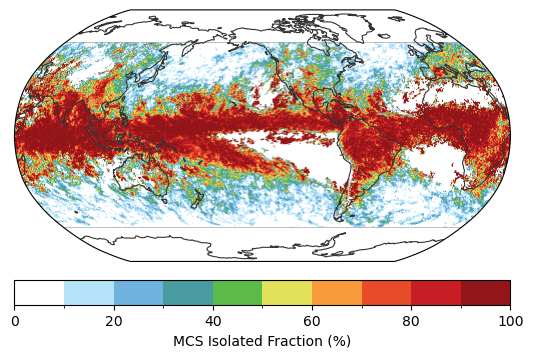

In [12]:
colormaps = cmaps.WhiteBlueGreenYellowRed
levels = np.arange(0, 100.1, 10)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=colormaps.N)

img = egh.healpix_show(mcs_iso_frac.sel(source='obs'), cmap=colormaps, norm=norm)
plt.colorbar(img, orientation='horizontal', pad=0.05, label='MCS Isolated Fraction (%)')

In [13]:
# img = egh.healpix_show(mcs_ar_etc_frac.sel(source='obs'), cmap=colormaps, norm=norm)
# plt.colorbar(img, orientation='horizontal', pad=0.05, label='MCS-AR-ETC Fraction (%)')

In [14]:
# img = egh.healpix_show(mcs_ar_frac.sel(source='obs'), cmap=colormaps, norm=norm)
# plt.colorbar(img, orientation='horizontal', pad=0.05, label='MCS-AR Fraction (%)')

In [15]:
# img = egh.healpix_show(dc_frac.sel(source='obs'), cmap=colormaps, norm=norm)
# plt.colorbar(img, orientation='horizontal', pad=0.05, label='DC Fraction (%)')

In [16]:
# img = egh.healpix_show(st_frac.sel(source='obs'), cmap=colormaps, norm=norm)
# plt.colorbar(img, orientation='horizontal', pad=0.05, label='ST Fraction (%)')

In [17]:
# img = egh.healpix_show(nd_frac.sel(source='obs'), cmap=colormaps, norm=norm)
# plt.colorbar(img, orientation='horizontal', pad=0.05, label='ND Fraction (%)')

In [18]:
# img = egh.healpix_show(dz_frac.sel(source='obs'), cmap=colormaps, norm=norm)
# plt.colorbar(img, orientation='horizontal', pad=0.05, label='DZ Fraction (%)')

In [19]:
# colormaps = cmaps.WhiteBlueGreenYellowRed
# levels = np.arange(0, 100.1, 10)
# norm = colors.BoundaryNorm(boundaries=levels, ncolors=colormaps.N)

# img = egh.healpix_show(res_frac.sel(source='obs'), cmap=colormaps, norm=norm)
# plt.colorbar(img, orientation='horizontal', pad=0.05, label='Residual Fraction (%)')

## Filter data by latitude bands

### Tropics

In [20]:
tropics_lat = [-20, 20]
# Land threshold
land_thresh = 0.9

# Isolated features
mcs_iso_frac_trop = mcs_iso_frac.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
ar_iso_frac_trop = ar_iso_frac.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
etc_iso_frac_trop = etc_iso_frac.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
tc_frac_trop = tc_frac.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
# Co-occurring features
mcs_ar_frac_trop = mcs_ar_frac.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
mcs_etc_frac_trop = mcs_etc_frac.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
ar_etc_frac_trop = ar_etc_frac.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
mcs_ar_etc_frac_trop = mcs_ar_etc_frac.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
# Cloud types (not tracked)
dc_frac_trop = dc_frac.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
nd_frac_trop = nd_frac.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
st_frac_trop = st_frac.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
dz_frac_trop = dz_frac.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
# Residual fraction
res_frac_trop = res_frac.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))

# LAND-ONLY TROPICAL REGIONS
# Isolated features
mcs_iso_frac_trop_l = mcs_iso_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac >= land_thresh))
ar_iso_frac_trop_l = ar_iso_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac >= land_thresh))
etc_iso_frac_trop_l = etc_iso_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac >= land_thresh))
tc_frac_trop_l = tc_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac >= land_thresh))
# Co-occurring features
mcs_ar_frac_trop_l = mcs_ar_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac >= land_thresh))
mcs_etc_frac_trop_l = mcs_etc_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac >= land_thresh))
ar_etc_frac_trop_l = ar_etc_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac >= land_thresh))
mcs_ar_etc_frac_trop_l = mcs_ar_etc_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac >= land_thresh))
# Cloud types (not tracked)
dc_frac_trop_l = dc_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac >= land_thresh))
nd_frac_trop_l = nd_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac >= land_thresh))
st_frac_trop_l = st_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac >= land_thresh))
dz_frac_trop_l = dz_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac >= land_thresh))
# Residual fraction
res_frac_trop_l = res_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac >= land_thresh))

# OCEAN-ONLY TROPICAL REGIONS
# Isolated features
mcs_iso_frac_trop_o = mcs_iso_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac < land_thresh))
ar_iso_frac_trop_o = ar_iso_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac < land_thresh))
etc_iso_frac_trop_o = etc_iso_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac < land_thresh))
tc_frac_trop_o = tc_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac < land_thresh))
# Co-occurring features
mcs_ar_frac_trop_o = mcs_ar_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac < land_thresh))
mcs_etc_frac_trop_o = mcs_etc_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac < land_thresh))
ar_etc_frac_trop_o = ar_etc_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac < land_thresh))
mcs_ar_etc_frac_trop_o = mcs_ar_etc_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac < land_thresh))
# Cloud types (not tracked)
dc_frac_trop_o = dc_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac < land_thresh))
nd_frac_trop_o = nd_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac < land_thresh))
st_frac_trop_o = st_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac < land_thresh))
dz_frac_trop_o = dz_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac < land_thresh))
# Residual fraction
res_frac_trop_o = res_frac.where(((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat))) & (landfrac < land_thresh))

### Mid-latitude

In [21]:
# Isolated features
mcs_iso_frac_extrop = mcs_iso_frac.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
ar_iso_frac_extrop = ar_iso_frac.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
etc_iso_frac_extrop = etc_iso_frac.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
tc_frac_extrop = tc_frac.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
# Co-occurring features
mcs_ar_frac_extrop = mcs_ar_frac.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
mcs_etc_frac_extrop = mcs_etc_frac.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
ar_etc_frac_extrop = ar_etc_frac.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
mcs_ar_etc_frac_extrop = mcs_ar_etc_frac.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
# Cloud types (not tracked)
dc_frac_extrop = dc_frac.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
nd_frac_extrop = nd_frac.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
st_frac_extrop = st_frac.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
dz_frac_extrop = dz_frac.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
# Residual fraction
res_frac_extrop = res_frac.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

# LAND-ONLY EXTROPICAL REGIONS

# Isolated features
mcs_iso_frac_extrop_l = mcs_iso_frac.where(((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat))) & (landfrac >= land_thresh))
ar_iso_frac_extrop_l = ar_iso_frac.where(((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat))) & (landfrac >= land_thresh))
etc_iso_frac_extrop_l = etc_iso_frac.where(((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat))) & (landfrac >= land_thresh))
tc_frac_extrop_l = tc_frac.where(((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat))) & (landfrac >= land_thresh))
# Co-occurring features
mcs_ar_frac_extrop_l = mcs_ar_frac.where(((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat))) & (landfrac >= land_thresh))
mcs_etc_frac_extrop_l = mcs_etc_frac.where(((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat))) & (landfrac >= land_thresh))
ar_etc_frac_extrop_l = ar_etc_frac.where(((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat))) & (landfrac >= land_thresh))
mcs_ar_etc_frac_extrop_l = mcs_ar_etc_frac.where(((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat))) & (landfrac >= land_thresh))
# Cloud types (not tracked)
dc_frac_extrop_l = dc_frac.where(((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat))) & (landfrac >= land_thresh))
nd_frac_extrop_l = nd_frac.where(((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat))) & (landfrac >= land_thresh))
st_frac_extrop_l = st_frac.where(((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat))) & (landfrac >= land_thresh))
dz_frac_extrop_l = dz_frac.where(((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat))) & (landfrac >= land_thresh))
# Residual fraction
res_frac_extrop_l = res_frac.where(((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat))) & (landfrac >= land_thresh))

# LAND-ONLY Extratropical Northern Hemisphere

# Isolated features
mcs_iso_frac_nh_l = mcs_iso_frac.where((hp_lat > max(tropics_lat)) & (landfrac >= land_thresh))
ar_iso_frac_nh_l = ar_iso_frac.where((hp_lat > max(tropics_lat)) & (landfrac >= land_thresh))
etc_iso_frac_nh_l = etc_iso_frac.where((hp_lat > max(tropics_lat)) & (landfrac >= land_thresh))
tc_frac_nh_l = tc_frac.where((hp_lat > max(tropics_lat)) & (landfrac >= land_thresh))
# Co-occurring features
mcs_ar_frac_nh_l = mcs_ar_frac.where((hp_lat > max(tropics_lat)) & (landfrac >= land_thresh))
mcs_etc_frac_nh_l = mcs_etc_frac.where((hp_lat > max(tropics_lat)) & (landfrac >= land_thresh))
ar_etc_frac_nh_l = ar_etc_frac.where((hp_lat > max(tropics_lat)) & (landfrac >= land_thresh))
mcs_ar_etc_frac_nh_l = mcs_ar_etc_frac.where((hp_lat > max(tropics_lat)) & (landfrac >= land_thresh))
# Cloud types (not tracked)
dc_frac_nh_l = dc_frac.where((hp_lat > max(tropics_lat)) & (landfrac >= land_thresh))
nd_frac_nh_l = nd_frac.where((hp_lat > max(tropics_lat)) & (landfrac >= land_thresh))
st_frac_nh_l = st_frac.where((hp_lat > max(tropics_lat)) & (landfrac >= land_thresh))
dz_frac_nh_l = dz_frac.where((hp_lat > max(tropics_lat)) & (landfrac >= land_thresh))
# Residual fraction
res_frac_nh_l = res_frac.where((hp_lat > max(tropics_lat)) & (landfrac >= land_thresh))

# LAND-ONLY Extratropical Southern Hemisphere

# Isolated features
mcs_iso_frac_sh_l = mcs_iso_frac.where((hp_lat < min(tropics_lat)) & (landfrac >= land_thresh))
ar_iso_frac_sh_l = ar_iso_frac.where((hp_lat < min(tropics_lat)) & (landfrac >= land_thresh))
etc_iso_frac_sh_l = etc_iso_frac.where((hp_lat < min(tropics_lat)) & (landfrac >= land_thresh))
tc_frac_sh_l = tc_frac.where((hp_lat < min(tropics_lat)) & (landfrac >= land_thresh))
# Co-occurring features
mcs_ar_frac_sh_l = mcs_ar_frac.where((hp_lat < min(tropics_lat)) & (landfrac >= land_thresh))
mcs_etc_frac_sh_l = mcs_etc_frac.where((hp_lat < min(tropics_lat)) & (landfrac >= land_thresh))
ar_etc_frac_sh_l = ar_etc_frac.where((hp_lat < min(tropics_lat)) & (landfrac >= land_thresh))
mcs_ar_etc_frac_sh_l = mcs_ar_etc_frac.where((hp_lat < min(tropics_lat)) & (landfrac >= land_thresh))
# Cloud types (not tracked)
dc_frac_sh_l = dc_frac.where((hp_lat < min(tropics_lat)) & (landfrac >= land_thresh))
nd_frac_sh_l = nd_frac.where((hp_lat < min(tropics_lat)) & (landfrac >= land_thresh))
st_frac_sh_l = st_frac.where((hp_lat < min(tropics_lat)) & (landfrac >= land_thresh))
dz_frac_sh_l = dz_frac.where((hp_lat < min(tropics_lat)) & (landfrac >= land_thresh))
# Residual fraction
res_frac_sh_l = res_frac.where((hp_lat < min(tropics_lat)) & (landfrac >= land_thresh))

# OCEAN-ONLY Extratropical Northern Hemisphere

# Isolated features
mcs_iso_frac_nh_o = mcs_iso_frac.where((hp_lat > max(tropics_lat)) & (landfrac < land_thresh))
ar_iso_frac_nh_o = ar_iso_frac.where((hp_lat > max(tropics_lat)) & (landfrac < land_thresh))
etc_iso_frac_nh_o = etc_iso_frac.where((hp_lat > max(tropics_lat)) & (landfrac < land_thresh))
tc_frac_nh_o = tc_frac.where((hp_lat > max(tropics_lat)) & (landfrac < land_thresh))
# Co-occurring features
mcs_ar_frac_nh_o = mcs_ar_frac.where((hp_lat > max(tropics_lat)) & (landfrac < land_thresh))
mcs_etc_frac_nh_o = mcs_etc_frac.where((hp_lat > max(tropics_lat)) & (landfrac < land_thresh))
ar_etc_frac_nh_o = ar_etc_frac.where((hp_lat > max(tropics_lat)) & (landfrac < land_thresh))
mcs_ar_etc_frac_nh_o = mcs_ar_etc_frac.where((hp_lat > max(tropics_lat)) & (landfrac < land_thresh))
# Cloud types (not tracked)
dc_frac_nh_o = dc_frac.where((hp_lat > max(tropics_lat)) & (landfrac < land_thresh))
nd_frac_nh_o = nd_frac.where((hp_lat > max(tropics_lat)) & (landfrac < land_thresh))
st_frac_nh_o = st_frac.where((hp_lat > max(tropics_lat)) & (landfrac < land_thresh))
dz_frac_nh_o = dz_frac.where((hp_lat > max(tropics_lat)) & (landfrac < land_thresh))
# Residual fraction
res_frac_nh_o = res_frac.where((hp_lat > max(tropics_lat)) & (landfrac < land_thresh))

# OCEAN-ONLY Extratropical Southern Hemisphere

# Isolated features
mcs_iso_frac_sh_o = mcs_iso_frac.where((hp_lat < min(tropics_lat)) & (landfrac < land_thresh))
ar_iso_frac_sh_o = ar_iso_frac.where((hp_lat < min(tropics_lat)) & (landfrac < land_thresh))
etc_iso_frac_sh_o = etc_iso_frac.where((hp_lat < min(tropics_lat)) & (landfrac < land_thresh))
tc_frac_sh_o = tc_frac.where((hp_lat < min(tropics_lat)) & (landfrac < land_thresh))
# Co-occurring features
mcs_ar_frac_sh_o = mcs_ar_frac.where((hp_lat < min(tropics_lat)) & (landfrac < land_thresh))
mcs_etc_frac_sh_o = mcs_etc_frac.where((hp_lat < min(tropics_lat)) & (landfrac < land_thresh))
ar_etc_frac_sh_o = ar_etc_frac.where((hp_lat < min(tropics_lat)) & (landfrac < land_thresh))
mcs_ar_etc_frac_sh_o = mcs_ar_etc_frac.where((hp_lat < min(tropics_lat)) & (landfrac < land_thresh))
# Cloud types (not tracked)
dc_frac_sh_o = dc_frac.where((hp_lat < min(tropics_lat)) & (landfrac < land_thresh))
nd_frac_sh_o = nd_frac.where((hp_lat < min(tropics_lat)) & (landfrac < land_thresh))
st_frac_sh_o = st_frac.where((hp_lat < min(tropics_lat)) & (landfrac < land_thresh))
dz_frac_sh_o = dz_frac.where((hp_lat < min(tropics_lat)) & (landfrac < land_thresh))
# Residual fraction
res_frac_sh_o = res_frac.where((hp_lat < min(tropics_lat)) & (landfrac < land_thresh))

<Figure size 640x480 with 0 Axes>

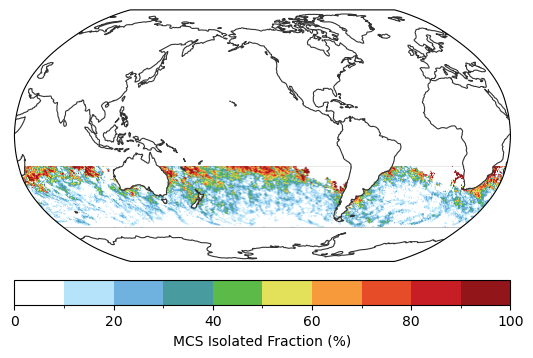

In [22]:
colormaps = cmaps.WhiteBlueGreenYellowRed
levels = np.arange(0, 100.1, 10)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=colormaps.N)

img = egh.healpix_show(mcs_iso_frac_sh_o.sel(source='obs'), cmap=colormaps, norm=norm)
plt.colorbar(img, orientation='horizontal', pad=0.05, label='MCS Isolated Fraction (%)')

## Calculate regional mean fractions

### Tropics

In [23]:
# Isolated features
mcs_iso_frac_trop_avg = mcs_iso_frac_trop.mean(dim='cell')
ar_iso_frac_trop_avg = ar_iso_frac_trop.mean(dim='cell')
etc_iso_frac_trop_avg = etc_iso_frac_trop.mean(dim='cell')
tc_frac_trop_avg = tc_frac_trop.mean(dim='cell')
# Co-occurring features
mcs_ar_frac_trop_avg = mcs_ar_frac_trop.mean(dim='cell')
mcs_etc_frac_trop_avg = mcs_etc_frac_trop.mean(dim='cell')
ar_etc_frac_trop_avg = ar_etc_frac_trop.mean(dim='cell')
mcs_ar_etc_frac_trop_avg = mcs_ar_etc_frac_trop.mean(dim='cell')
# Cloud types (not tracked)
dc_frac_trop_avg = dc_frac_trop.mean(dim='cell')
nd_frac_trop_avg = nd_frac_trop.mean(dim='cell')
st_frac_trop_avg = st_frac_trop.mean(dim='cell')
dz_frac_trop_avg = dz_frac_trop.mean(dim='cell')
# Residual fraction
res_frac_trop_avg = res_frac_trop.mean(dim='cell')

# LAND-ONLY TROPICAL REGIONS

# Isolated features
mcs_iso_frac_trop_l_avg = mcs_iso_frac_trop_l.mean(dim='cell')
ar_iso_frac_trop_l_avg = ar_iso_frac_trop_l.mean(dim='cell')
etc_iso_frac_trop_l_avg = etc_iso_frac_trop_l.mean(dim='cell')
tc_frac_trop_l_avg = tc_frac_trop_l.mean(dim='cell')
# Co-occurring features
mcs_ar_frac_trop_l_avg = mcs_ar_frac_trop_l.mean(dim='cell')
mcs_etc_frac_trop_l_avg = mcs_etc_frac_trop_l.mean(dim='cell')
ar_etc_frac_trop_l_avg = ar_etc_frac_trop_l.mean(dim='cell')
mcs_ar_etc_frac_trop_l_avg = mcs_ar_etc_frac_trop_l.mean(dim='cell')
# Cloud types (not tracked)
dc_frac_trop_l_avg = dc_frac_trop_l.mean(dim='cell')
nd_frac_trop_l_avg = nd_frac_trop_l.mean(dim='cell')
st_frac_trop_l_avg = st_frac_trop_l.mean(dim='cell')
dz_frac_trop_l_avg = dz_frac_trop_l.mean(dim='cell')
# Residual fraction
res_frac_trop_l_avg = res_frac_trop_l.mean(dim='cell')

# OCEAN-ONLY TROPICAL REGIONS

# Isolated features
mcs_iso_frac_trop_o_avg = mcs_iso_frac_trop_o.mean(dim='cell')
ar_iso_frac_trop_o_avg = ar_iso_frac_trop_o.mean(dim='cell')
etc_iso_frac_trop_o_avg = etc_iso_frac_trop_o.mean(dim='cell')
tc_frac_trop_o_avg = tc_frac_trop_o.mean(dim='cell')
# Co-occurring features
mcs_ar_frac_trop_o_avg = mcs_ar_frac_trop_o.mean(dim='cell')
mcs_etc_frac_trop_o_avg = mcs_etc_frac_trop_o.mean(dim='cell')
ar_etc_frac_trop_o_avg = ar_etc_frac_trop_o.mean(dim='cell')
mcs_ar_etc_frac_trop_o_avg = mcs_ar_etc_frac_trop_o.mean(dim='cell')
# Cloud types (not tracked)
dc_frac_trop_o_avg = dc_frac_trop_o.mean(dim='cell')
nd_frac_trop_o_avg = nd_frac_trop_o.mean(dim='cell')
st_frac_trop_o_avg = st_frac_trop_o.mean(dim='cell')
dz_frac_trop_o_avg = dz_frac_trop_o.mean(dim='cell')
# Residual fraction
res_frac_trop_o_avg = res_frac_trop_o.mean(dim='cell')

### Mid-latitude

In [24]:
# LAND-ONLY Extratropical Northern Hemisphere

# Isolated features
mcs_iso_frac_nh_l = mcs_iso_frac_nh_l.mean(dim='cell')
ar_iso_frac_nh_l = ar_iso_frac_nh_l.mean(dim='cell')
etc_iso_frac_nh_l = etc_iso_frac_nh_l.mean(dim='cell')
tc_frac_nh_l = tc_frac_nh_l.mean(dim='cell')
# Co-occurring features
mcs_ar_frac_nh_l = mcs_ar_frac_nh_l.mean(dim='cell')
mcs_etc_frac_nh_l = mcs_etc_frac_nh_l.mean(dim='cell')
ar_etc_frac_nh_l = ar_etc_frac_nh_l.mean(dim='cell')
mcs_ar_etc_frac_nh_l = mcs_ar_etc_frac_nh_l.mean(dim='cell')
# Cloud types (not tracked)
dc_frac_nh_l = dc_frac_nh_l.mean(dim='cell')
nd_frac_nh_l = nd_frac_nh_l.mean(dim='cell')
st_frac_nh_l = st_frac_nh_l.mean(dim='cell')
dz_frac_nh_l = dz_frac_nh_l.mean(dim='cell')
# Residual fraction
res_frac_nh_l = res_frac_nh_l.mean(dim='cell')

# LAND-ONLY Extratropical Southern Hemisphere

# Isolated features
mcs_iso_frac_sh_l = mcs_iso_frac_sh_l.mean(dim='cell')
ar_iso_frac_sh_l = ar_iso_frac_sh_l.mean(dim='cell')
etc_iso_frac_sh_l = etc_iso_frac_sh_l.mean(dim='cell')
tc_frac_sh_l = tc_frac_sh_l.mean(dim='cell')
# Co-occurring features
mcs_ar_frac_sh_l = mcs_ar_frac_sh_l.mean(dim='cell')
mcs_etc_frac_sh_l = mcs_etc_frac_sh_l.mean(dim='cell')
ar_etc_frac_sh_l = ar_etc_frac_sh_l.mean(dim='cell')
mcs_ar_etc_frac_sh_l = mcs_ar_etc_frac_sh_l.mean(dim='cell')
# Cloud types (not tracked)
dc_frac_sh_l = dc_frac_sh_l.mean(dim='cell')
nd_frac_sh_l = nd_frac_sh_l.mean(dim='cell')
st_frac_sh_l = st_frac_sh_l.mean(dim='cell')
dz_frac_sh_l = dz_frac_sh_l.mean(dim='cell')
# Residual fraction
res_frac_sh_l = res_frac_sh_l.mean(dim='cell')

# OCEAN-ONLY Extratropical Northern Hemisphere

# Isolated features
mcs_iso_frac_nh_o = mcs_iso_frac_nh_o.mean(dim='cell')
ar_iso_frac_nh_o = ar_iso_frac_nh_o.mean(dim='cell')
etc_iso_frac_nh_o = etc_iso_frac_nh_o.mean(dim='cell')
tc_frac_nh_o = tc_frac_nh_o.mean(dim='cell')
# Co-occurring features
mcs_ar_frac_nh_o = mcs_ar_frac_nh_o.mean(dim='cell')
mcs_etc_frac_nh_o = mcs_etc_frac_nh_o.mean(dim='cell')
ar_etc_frac_nh_o = ar_etc_frac_nh_o.mean(dim='cell')
mcs_ar_etc_frac_nh_o = mcs_ar_etc_frac_nh_o.mean(dim='cell')
# Cloud types (not tracked)
dc_frac_nh_o = dc_frac_nh_o.mean(dim='cell')
nd_frac_nh_o = nd_frac_nh_o.mean(dim='cell')
st_frac_nh_o = st_frac_nh_o.mean(dim='cell')
dz_frac_nh_o = dz_frac_nh_o.mean(dim='cell')
# Residual fraction
res_frac_nh_o = res_frac_nh_o.mean(dim='cell')

# OCEAN-ONLY Extratropical Southern Hemisphere

# Isolated features
mcs_iso_frac_sh_o = mcs_iso_frac_sh_o.mean(dim='cell')
ar_iso_frac_sh_o = ar_iso_frac_sh_o.mean(dim='cell')
etc_iso_frac_sh_o = etc_iso_frac_sh_o.mean(dim='cell')
tc_frac_sh_o = tc_frac_sh_o.mean(dim='cell')
# Co-occurring features
mcs_ar_frac_sh_o = mcs_ar_frac_sh_o.mean(dim='cell')
mcs_etc_frac_sh_o = mcs_etc_frac_sh_o.mean(dim='cell')
ar_etc_frac_sh_o = ar_etc_frac_sh_o.mean(dim='cell')
mcs_ar_etc_frac_sh_o = mcs_ar_etc_frac_sh_o.mean(dim='cell')
# Cloud types (not tracked)
dc_frac_sh_o = dc_frac_sh_o.mean(dim='cell')
nd_frac_sh_o = nd_frac_sh_o.mean(dim='cell')
st_frac_sh_o = st_frac_sh_o.mean(dim='cell')
dz_frac_sh_o = dz_frac_sh_o.mean(dim='cell')
# Residual fraction
res_frac_sh_o = res_frac_sh_o.mean(dim='cell')

## Identify map of top N dominant precipitation types

In [25]:
def get_ranked_precip_types(pcpfrac_dict, source_name, top_n=3):
    """
    Identify the top N dominant precipitation types for each grid cell.
    
    Parameters:
    -----------
    pcpfrac_dict : dict
        Dictionary where keys are precipitation type names and values are 
        xarray.DataArrays with dimensions (source, cell)
    source_name : str
        Name of the source to process (e.g., 'obs', 'm1', 'm2', etc.)
    top_n : int
        Number of top precipitation types to return (default: 3)
    
    Returns:
    --------
    ranked_types : dict
        Dictionary with keys 'rank_1', 'rank_2', 'rank_3', etc., each containing
        an xarray.DataArray with dimensions (cell,) with values 1-9 indicating 
        the precipitation type at that rank
    ranked_values : dict
        Dictionary with keys 'rank_1', 'rank_2', 'rank_3', etc., each containing
        an xarray.DataArray with the actual precipitation fraction values
    """
    
    # Define the precipitation types and their assigned values
    precip_types = {
        'mcs_iso_frac': 1,
        'ar_iso_frac': 2,
        'etc_iso_frac': 3,
        'tc_frac': 4,
        'mcs_ar_frac': 5,
        'mcs_etc_frac': 6,
        'ar_etc_frac': 7,
        'mcs_ar_etc_frac': 8,
        'dc_frac': 9,
        'nd_frac': 10,
        'st_frac': 11,
        'dz_frac': 12,
        'res_frac': 13,
    }
    
    # Stack all precipitation fractions into a single array
    # Shape will be (n_types, n_cells)
    pcpfrac_stack = []
    type_values = []
    
    for ptype, value in precip_types.items():
        if ptype in pcpfrac_dict:
            # Select data for the specified source
            data = pcpfrac_dict[ptype].sel(source=source_name)
            pcpfrac_stack.append(data.values)
            type_values.append(value)
        else:
            print(f"Warning: {ptype} not found in input dictionary")
    
    # Convert to numpy array: shape (n_types, n_cells)
    pcpfrac_array = np.array(pcpfrac_stack)
    type_values_array = np.array(type_values)
    
    # Get indices that would sort the array in descending order
    # argsort returns ascending, so we negate to get descending
    sorted_indices = np.argsort(-pcpfrac_array, axis=0)
    
    # Create output dictionaries
    ranked_types = {}
    ranked_values = {}
    
    # Get coordinates from first precipitation type for creating DataArrays
    first_key = list(precip_types.keys())[0]
    cell_coord = pcpfrac_dict[first_key].cell
    
    # Extract top N ranks
    for rank in range(top_n):
        rank_key = f'rank_{rank+1}'
        
        # Get indices for this rank
        rank_indices = sorted_indices[rank, :]
        
        # Map indices to precipitation type values
        ranked_type_values = type_values_array[rank_indices]
        
        # Get the actual precipitation fraction values for this rank
        # Use advanced indexing to get values
        ranked_pcp_values = pcpfrac_array[rank_indices, np.arange(pcpfrac_array.shape[1])]
        
        # Create DataArrays
        ranked_types[rank_key] = xr.DataArray(
            ranked_type_values,
            dims=['cell'],
            coords={'cell': cell_coord},
            attrs={
                'long_name': f'Rank {rank+1} precipitation type',
                'description': '1=MCS_iso, 2=AR_iso, 3=ETC_iso, 4=TC, 5=MCS+AR, 6=MCS+ETC, 7=AR+ETC, 8=MCS+AR+ETC, 9=DC, 10=ND, 11=ST, 12=DZ, 13=Residual',
                'source': source_name,
                'rank': rank+1
            }
        )
        
        ranked_values[rank_key] = xr.DataArray(
            ranked_pcp_values,
            dims=['cell'],
            coords={'cell': cell_coord},
            attrs={
                'long_name': f'Rank {rank+1} precipitation fraction',
                'units': 'fraction',
                'source': source_name,
                'rank': rank+1
            }
        )
    
    return ranked_types, ranked_values

In [26]:
def get_all_sources_ranked_types(pcpfrac_dict, top_n=3):
    """
    Get ranked precipitation types for all sources.
    
    Parameters:
    -----------
    pcpfrac_dict : dict
        Dictionary where keys are precipitation type names and values are 
        xarray.DataArrays with dimensions (source, cell)
    top_n : int
        Number of top precipitation types to return (default: 3)
    
    Returns:
    --------
    ranked_types_all : dict
        Dictionary with keys 'rank_1', 'rank_2', 'rank_3', etc., each containing
        an xarray.DataArray with dimensions (source, cell)
    ranked_values_all : dict
        Dictionary with keys 'rank_1', 'rank_2', 'rank_3', etc., each containing
        an xarray.DataArray with the actual precipitation fraction values
    """
    
    # Get list of sources from the first precipitation type
    first_key = list(pcpfrac_dict.keys())[0]
    sources = pcpfrac_dict[first_key].source.values
    
    # Get all coordinates from the first entry to copy later
    source_coords = pcpfrac_dict[first_key].coords
    
    # Initialize output dictionaries
    ranked_types_all = {f'rank_{i+1}': [] for i in range(top_n)}
    ranked_values_all = {f'rank_{i+1}': [] for i in range(top_n)}
    
    # Calculate ranked types for each source
    for source in sources:
        ranked_types, ranked_values = get_ranked_precip_types(pcpfrac_dict, source, top_n)
        
        for rank_key in ranked_types.keys():
            ranked_types_all[rank_key].append(ranked_types[rank_key])
            ranked_values_all[rank_key].append(ranked_values[rank_key])
    
    # Concatenate into DataArrays with source dimension and copy coordinates
    for rank_key in ranked_types_all.keys():
        # Concatenate
        ranked_types_all[rank_key] = xr.concat(ranked_types_all[rank_key], dim='source')
        ranked_types_all[rank_key]['source'] = sources
        
        # Copy all coordinates from the original data
        for coord_name in source_coords:
            if coord_name != 'source' and coord_name in source_coords:
                ranked_types_all[rank_key].coords[coord_name] = source_coords[coord_name]
        
        # Same for ranked values
        ranked_values_all[rank_key] = xr.concat(ranked_values_all[rank_key], dim='source')
        ranked_values_all[rank_key]['source'] = sources
        
        # Copy all coordinates from the original data
        for coord_name in source_coords:
            if coord_name != 'source' and coord_name in source_coords:
                ranked_values_all[rank_key].coords[coord_name] = source_coords[coord_name]
    
    return ranked_types_all, ranked_values_all

In [27]:
# Prepare the dictionary with data
pcpfrac_dict = {
    'mcs_iso_frac': mcs_iso_frac,
    'ar_iso_frac': ar_iso_frac,
    'etc_iso_frac': etc_iso_frac,
    'tc_frac': tc_frac,
    'mcs_ar_frac': mcs_ar_frac,
    'mcs_etc_frac': mcs_etc_frac,
    'ar_etc_frac': ar_etc_frac,
    'mcs_ar_etc_frac': mcs_ar_etc_frac,
    'dc_frac': dc_frac,
    'nd_frac': nd_frac,
    'st_frac': st_frac,
    'dz_frac': dz_frac,
    'res_frac': res_frac,
}

# Get ranked types for all sources (top 3)
ranked_types_all, ranked_values_all = get_all_sources_ranked_types(pcpfrac_dict, top_n=3)

# Access individual ranks
dominant_types_all = ranked_types_all['rank_1']  # 1st place
second_types_all = ranked_types_all['rank_2']    # 2nd place
third_types_all = ranked_types_all['rank_3']     # 3rd place

# Also get the actual precipitation fraction values for each rank
dominant_values_all = ranked_values_all['rank_1']
second_values_all = ranked_values_all['rank_2']
third_values_all = ranked_values_all['rank_3']

# Or get for a specific source
ranked_types_obs, ranked_values_obs = get_ranked_precip_types(pcpfrac_dict, 'obs', top_n=3)

In [28]:
# Filter values in high latitudes
hilat_lat = [-60, 60]

dominant_values_all_filtered = dominant_values_all.where((hp_lat >= min(hilat_lat)) & (hp_lat <= max(hilat_lat)))
second_values_all_filtered = second_values_all.where((hp_lat >= min(hilat_lat)) & (hp_lat <= max(hilat_lat)))
third_values_all_filtered = third_values_all.where((hp_lat >= min(hilat_lat)) & (hp_lat <= max(hilat_lat)))

In [29]:
# def plot_ranked_precip_type(ranked_data, rank_num, source_name, figname=None, lat_range=(-60, 60)):
#     """
#     Plot map of ranked precipitation type.
    
#     Parameters:
#     -----------
#     ranked_data : xarray.DataArray
#         DataArray containing precipitation type values (1-13)
#     rank_num : int
#         Rank number (1, 2, or 3)
#     source_name : str
#         Source name for the title
#     figname : str, optional
#         Filename to save the figure
#     lat_range : tuple, optional
#         Latitude range to display (min_lat, max_lat). Default: (-60, 60)
#     """
    
#     # Define colors for each type with visual hierarchy
#     cof_colors = [
#         "#F9F530",  # 1: MCS_iso - yellow
#         "#11008d",  # 2: AR_iso - dark blue
#         "#19a519",  # 3: ETC_iso - green
#         '#d62728',  # 4: TC - red
#         "#059D96",  # 5: MCS_AR - teal/cyan
#         "#6332C4",  # 6: MCS_ETC - purple
#         "#BF3F0D",  # 7: AR_ETC - brownish orange
#         "#044F9A",  # 8: MCS_AR_ETC - dark blue
#         "#A500B7",  # 9: DC - dark purple
#         "#CB9ED0",  # 10: ND - light purple/pink
#         "#64F1BB",  # 11: ST - mint green
#         "#8E8E8E",  # 12: DZ - gray
#         "#E0E0E09F",  # 13: Residual - light gray
#     ]
#     # Define labels for colorbar
#     cof_labels = ['MCS', 'AR', 'ETC', 'TC', 
#                 'MCS-AR', 'MCS-ETC', 'AR-ETC', 'MCS-AR-ETC', 
#                 'DC', 'ND', 'ST', 'DZ', 'Residual']
    
#     cof_cmap = ListedColormap(cof_colors)
#     cof_norm = BoundaryNorm(boundaries=np.arange(0.5, 14.5, 1), ncolors=14)
    
#     # Create figure with Robinson projection
#     proj = ccrs.Robinson(central_longitude=225)
#     data_proj = ccrs.PlateCarree()
    
#     fig, ax = plt.subplots(figsize=(15, 8), subplot_kw={'projection': proj})
    
#     # Set global extent to keep the curved Earth appearance
#     ax.set_global()
    
#     # Add map features
#     ax.add_feature(cf.NaturalEarthFeature('physical', 'land', '110m'), 
#                    facecolor='none', edgecolor='k', zorder=3)
#     ax.set_aspect('auto', adjustable=None)
    
#     # Add gridlines
#     gl = ax.gridlines(crs=data_proj, draw_labels=False, linestyle='--', linewidth=0.5)
    
#     # Mask data outside the latitude range
#     # Get lat coordinates from the data
#     if hasattr(ranked_data, 'lat'):
#         lat_coord = ranked_data.lat
#     else:
#         # If lat is not a coordinate, try to get it from the healpix grid
#         lat_coord = hp_lat  # Assuming hp_lat is available from earlier in the notebook
    
#     # Create mask for latitude range
#     lat_mask = (lat_coord >= lat_range[0]) & (lat_coord <= lat_range[1])
    
#     # # Apply mask to data
#     masked_data = ranked_data.where(lat_mask)
#     # masked_data = ranked_data
    
#     # Plot data
#     im = egh.healpix_show(masked_data, ax=ax, cmap=cof_cmap, norm=cof_norm, zorder=2)
    
#     # # Optionally add latitude boundary lines to show the cutoff
#     # if lat_range[0] > -90 or lat_range[1] < 90:
#     #     for lat in [lat_range[0], lat_range[1]]:
#     #         lons = np.linspace(-180, 180, 361)
#     #         lats = np.full_like(lons, lat)
#     #         ax.plot(lons, lats, color='k', linestyle='--', linewidth=2, 
#     #                transform=data_proj, zorder=4, alpha=0.8)
    
#     # Add colorbar with labels
#     cbar = plt.colorbar(im, ax=ax, orientation='horizontal', pad=0.05, 
#                         ticks=np.arange(1, 14), shrink=0.8)
#     cbar.set_label(f'Rank {rank_num} Precipitation Type', fontsize=12, fontweight='bold')
#     cbar.ax.set_xticklabels(cof_labels, rotation=45, ha='right', fontsize=10)
    
#     # Add title
#     rank_suffix = {1: 'st', 2: 'nd', 3: 'rd'}.get(rank_num, 'th')
#     title_lat_info = f' ({lat_range[0]}°S to {lat_range[1]}°N)' if lat_range != (-90, 90) else ''
#     ax.set_title(f'{rank_num}{rank_suffix} Ranked Precipitation Type - {source_name}{title_lat_info}', 
#                  fontsize=14, fontweight='bold')
    
#     plt.tight_layout()
    
#     # Save figure if filename provided
#     if figname:
#         plt.savefig(figname, dpi=300, bbox_inches='tight')
#         print(f'Figure saved: {figname}')
    
#     plt.show()
#     return fig, ax

In [30]:
# # Example: Plot 1st, 2nd, and 3rd ranked types for OBS
# plot_ranked_precip_type(ranked_types_obs['rank_1'], 1, 'OBS', )
#                         # figname=f'{figdir}rank1_precip_type_obs.pdf')
# plot_ranked_precip_type(ranked_types_obs['rank_2'], 2, 'OBS', )
#                         # figname=f'{figdir}rank2_precip_type_obs.pdf')
# plot_ranked_precip_type(ranked_types_obs['rank_3'], 3, 'OBS', )
#                         # figname=f'{figdir}rank3_precip_type_obs.pdf')

## Plot ranked type maps

In [31]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=256):
    """
    Truncate colormap.
    """
    new_cmap = mpl.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

In [32]:
def plot_ranked_types_grid(da_list, titles, figname, 
                          min_thresh=None, wspace=None, hspace=None,
                          figsize=None, fontsize=None, cb_fontsize=None, 
                          show_gridlines=False, figtitle=None, dpi=200, 
                          lon_label=False, lat_label=False,
                          lat_lines=None, lat_range=None):
    """
    Plot a grid of ranked precipitation type maps with custom discrete colormap
    
    Parameters:
    -----------
    da_list : list of lists
        2D list of xarray DataArrays to plot (ranked type data with values 1-9), 
        dimensions should be [nrow][ncol]
    titles : list of lists
        2D list of titles for each panel, dimensions should be [nrow][ncol]
    figname : str
        Output filename
    min_thresh : float, optional
        Minimum threshold for data display (not typically used for type data)
    lat_range : tuple, optional
        (lat_min, lat_max) to clip display, e.g., (-60, 60)
    lat_lines : list, optional
        List of latitude values to plot as horizontal lines
    wspace : float, optional
        Width space between subplots
    hspace : float, optional
        Height space between subplots
    figsize : tuple, optional
        Figure size (width, height)
    fontsize : int, optional
        Font size for labels
    cb_fontsize : int, optional
        Font size for colorbar labels
    show_gridlines : bool, optional
        Whether to show gridlines
    lon_label : bool or list
        Show longitude labels on gridlines. Can be single bool or list matching data_arrays structure
    lat_label : bool or list
        Show latitude labels on gridlines. Can be single bool or list matching data_arrays structure
    figtitle : str, optional
        Figure title
    dpi : int, optional
        Resolution for saved figure
    
    Returns:
    --------
    fig : matplotlib.figure.Figure
        The created figure object
    """
    
    # Define colors for each type with visual hierarchy
    cof_colors = [
        "#F9F530",  # 1: MCS_iso - yellow
        "#11008d",  # 2: AR_iso - dark blue
        "#19a519",  # 3: ETC_iso - green
        '#d62728',  # 4: TC - red
        "#059D96",  # 5: MCS_AR - teal/cyan
        "#6332C4",  # 6: MCS_ETC - purple
        "#BF3F0D",  # 7: AR_ETC - brownish orange
        "#044F9A",  # 8: MCS_AR_ETC - dark blue
        "#A500B7",  # 9: DC - dark purple
        "#CB9ED0",  # 10: ND - light purple/pink
        "#64F1BB",  # 11: ST - mint green
        "#8E8E8E",  # 12: DZ - gray
        "#E0E0E09F",  # 13: Residual - light gray
    ]
    # Define labels for colorbar
    cof_labels = ['MCS', 'AR', 'ETC', 'TC', 
                'MCS-AR', 'MCS-ETC', 'AR-ETC', 'MCS-AR-ETC', 
                'DC', 'ND', 'ST', 'DZ', 'Residual']
    
    cof_cmap = ListedColormap(cof_colors)
    cof_norm = BoundaryNorm(boundaries=np.arange(0.5, 14.5, 1), ncolors=14)

    # Get grid dimensions from input data
    nrow = len(da_list)
    ncol = len(da_list[0]) if nrow > 0 else 0
    
    # Handle case where parameters might be the same for all panels
    def ensure_grid_format(param, param_name):
        if not isinstance(param, list):
            # If single value provided, apply to all panels
            return [[param for _ in range(ncol)] for _ in range(nrow)]
        elif isinstance(param, list):
            if len(param) == 0:
                # Empty list
                return [[[] for _ in range(ncol)] for _ in range(nrow)]
            elif isinstance(param[0], list):
                # Already a list of lists, return as is
                return param
            else:
                # It's a 1D list, use same list for all panels
                return [[param for _ in range(ncol)] for _ in range(nrow)]
        return param
    
    # Ensure titles have proper grid format
    titles = ensure_grid_format(titles, "titles")
    
    mpl.rcParams['font.size'] = fontsize
    proj = ccrs.Robinson(central_longitude=225)
    data_proj = ccrs.PlateCarree()
    resolution = '110m'
    land = cf.NaturalEarthFeature('physical', 'land', resolution)

    fig = plt.figure(figsize=figsize, dpi=100)
    # Setup two columns (left: plots, right: colorbar)
    gs0 = gridspec.GridSpec(1, 2, figure=fig, height_ratios=[1], width_ratios=[1, 0.02], wspace=0.05)
    # Setup panels to the left
    h_ratios = list(np.repeat(1, nrow))
    w_ratios = list(np.repeat(1, ncol))
    gs = gridspec.GridSpecFromSubplotSpec(nrow, ncol, subplot_spec=gs0[0], 
                                         height_ratios=h_ratios, width_ratios=w_ratios, 
                                         wspace=wspace, hspace=hspace)
    
    # Loop over each panel in the grid
    cf1 = None  # Will store the last plot for colorbar
    for row in range(nrow):
        for col in range(ncol):
            # Get panel index
            panel_idx = row * ncol + col

            # Get data for this panel
            Var = da_list[row][col]
            if Var is not None:
            
                # Create subplot
                ax = plt.subplot(gs[panel_idx], projection=proj)
                ax.set_global()
                ax.add_feature(land, facecolor='none', edgecolor='k', zorder=3)
                ax.set_aspect('auto', adjustable=None)
                
                # Add title
                ax.set_title(titles[row][col], fontsize=fontsize, loc='left')
                # flabel = ax.text(0.02, 0.94, titles[row][col], transform=ax.transAxes, fontsize=fontsize)
                # flabel.set_bbox(dict(facecolor='w', alpha=0.8, edgecolor='w'))
                               
                # # Mask data outside the latitude range if specified
                # if lat_range is not None:
                #     # Get lat coordinates from the data
                #     if hasattr(Var, 'lat'):
                #         lat_coord = Var.lat
                #     else:
                #         # If lat is not a coordinate, try to get it from the healpix grid
                #         lat_coord = hp_lat
                    
                #     # Create mask for latitude range
                #     lat_mask = (lat_coord >= lat_range[0]) & (lat_coord <= lat_range[1])
                    
                #     # Apply mask to data
                #     Var = Var.where(lat_mask)
                
                # Apply minimum threshold if provided (unlikely for type data)
                if min_thresh is not None:
                    Var = Var.where(Var > min_thresh)
                
                # Plot data with discrete colormap
                cf1 = egh.healpix_show(Var, ax=ax, cmap=cof_cmap, norm=cof_norm, zorder=2)
                
                # Add latitude lines if specified
                if lat_lines is not None:
                    for lat in lat_lines:
                        # Create longitude array spanning the globe
                        lons = np.linspace(-180, 180, 361)
                        lats = np.full_like(lons, lat)
                        ax.plot(lons, lats, color='k', linestyle='--', linewidth=1.5, 
                            transform=data_proj, zorder=4, alpha=0.8)
                        
                # Set latitude range if provided
                if lat_range is not None:
                    lat_min, lat_max = lat_range
                    _, y_min = proj.transform_point(0, lat_min, ccrs.PlateCarree())
                    _, y_max = proj.transform_point(0, lat_max, ccrs.PlateCarree())
                    ax.set_ylim([y_min, y_max])

                # Add gridlines
                if show_gridlines:
                    # gl = ax.gridlines(crs=data_proj, draw_labels=False, linestyle='--', linewidth=0.5, zorder=10)
                    gl = ax.gridlines(draw_labels=lon_label[row][col] or lat_label[row][col], 
                                    linestyle='--', linewidth=0.5, color='gray', alpha=0.8, zorder=10)
                    
                    # Configure which labels to show
                    if lon_label[row][col] or lat_label[row][col]:
                        gl.top_labels = False
                        gl.right_labels = False
                        gl.bottom_labels = lon_label[row][col]
                        gl.left_labels = lat_label[row][col]
                        gl.xlabel_style = {'size': fontsize-2}
                        gl.ylabel_style = {'size': fontsize-2}
    
    # Add colorbar (using the last plotted data)
    if cf1 is not None:
        cax = plt.subplot(gs0[1])
        cbar = plt.colorbar(cf1, cax=cax, label='', 
                           ticks=np.arange(1, 14), orientation='vertical', extend='neither')
        # Set custom tick labels
        cbar.ax.set_yticklabels(cof_labels, fontsize=cb_fontsize)
    
    # Add suptitle
    if figtitle:
        fig.suptitle(figtitle, y=0.92, fontweight='bold', fontsize=fontsize+2)
    
    # Save figure
    fig.savefig(figname, dpi=dpi, bbox_inches='tight', facecolor='w')
    print(f'Figure saved: {figname}')
    return fig

/global/common/software/m1867/python/hackathon/lib/python3.12/site-packages/numpy/_core/numeric.py:366: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')
/global/common/software/m1867/python/hackathon/lib/python3.12/site-packages/numpy/_core/numeric.py:366: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')
/global/common/software/m1867/python/hackathon/lib/python3.12/site-packages/numpy/_core/numeric.py:366: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')
/global/common/software/m1867/python/hackathon/lib/python3.12/site-packages/numpy/_core/numeric.py:366: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')
/global/common/software/m1867/python/hackathon/lib/python3.12/site-packages/numpy/_core/numeric.py:366: RuntimeWarning: invalid value encountered in cast
  multiarray.copyt

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof_extremerain/globalmap_extreme_precip_P95_rank1_types_annual.pdf


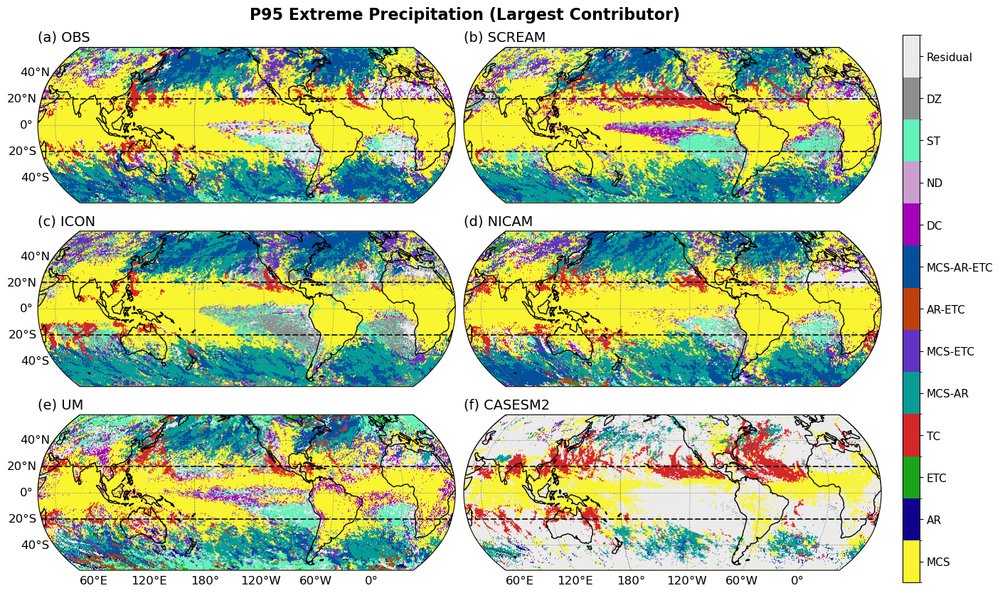

In [33]:
# Prepare data as 2D list
sources = ['obs', 'm1', 'm2', 'm3', 'm4', 'm5']
nrow = 3
ncol = 2

figsize = (16, 10)
fontsize = 14
cb_fontsize = 11
wspace = 0.02
hspace = 0.02
lat_range = (-60, 60)
figtitle = f'{extreme_percentile.upper()} Extreme Precipitation (Largest Contributor)'
figname = f'{figdir}globalmap_extreme_precip_{extreme_percentile.upper()}_rank1_types_annual.pdf'

# Create 2D lists for data and titles
da_list = []
titles = []
row_data = []
row_titles = []

for i, src in enumerate(sources):
    row_data.append(dominant_types_all.sel(source=src))
    row_titles.append(f'({chr(ord("a") + i)}) {name_map_plot[src]}')
    
    # Start new row after ncol panels
    if (i + 1) % ncol == 0 or i == len(sources) - 1:
        # Pad with None if needed for last row
        while len(row_data) < ncol:
            row_data.append(None)
            row_titles.append('')
        
        da_list.append(row_data)
        titles.append(row_titles)
        row_data = []
        row_titles = []

# Configure gridline labels: show labels on leftmost column and bottom row
lon_label = [[False, False],
             [False, False],
             [True, True]]
lat_label = [[True, False],
             [True, False],
             [True, False],]

# Plot the grid
fig = plot_ranked_types_grid(
    da_list=da_list,
    titles=titles,
    figname=figname,
    figsize=figsize,
    fontsize=fontsize,
    cb_fontsize=cb_fontsize,
    wspace=wspace,
    hspace=hspace,
    show_gridlines=True,
    lon_label=lon_label, lat_label=lat_label,
    lat_range=lat_range,
    lat_lines=tropics_lat,
    figtitle=figtitle,
    dpi=300,    
)

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof_extremerain/globalmap_extreme_precip_P95_rank1_types_annual_land.pdf


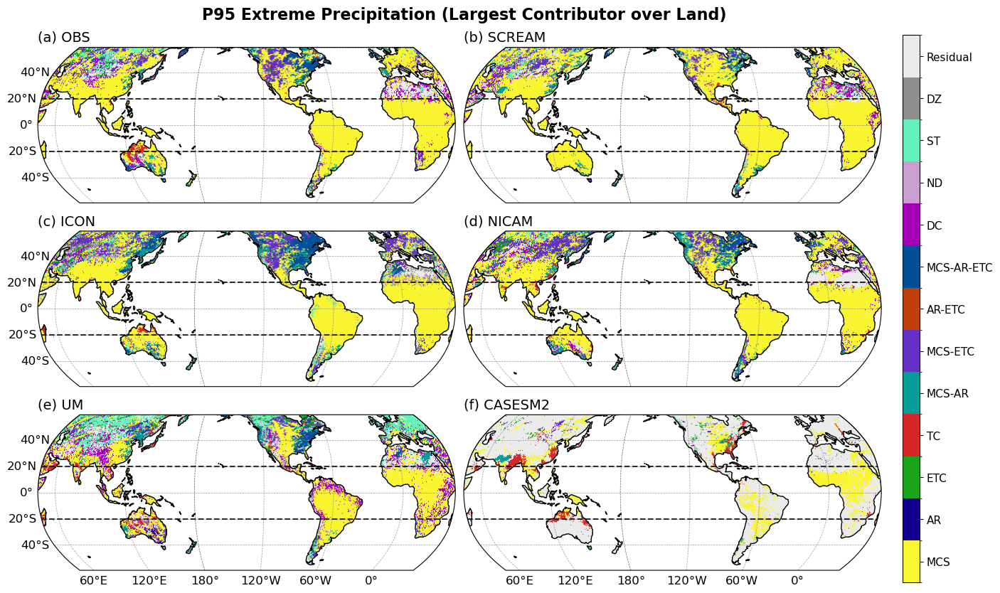

In [34]:
# Prepare data as 2D list
sources = ['obs', 'm1', 'm2', 'm3', 'm4', 'm5']
nrow = 3
ncol = 2

figtitle = f'{extreme_percentile.upper()} Extreme Precipitation (Largest Contributor over Land)'
figname = f'{figdir}globalmap_extreme_precip_{extreme_percentile.upper()}_rank1_types_annual_land.pdf'

# Create 2D lists for data and titles
da_list = []
titles = []
row_data = []
row_titles = []

for i, src in enumerate(sources):
    row_data.append(dominant_types_all.sel(source=src).where(landfrac > land_thresh))
    row_titles.append(f'({chr(ord("a") + i)}) {name_map_plot[src]}')
    
    # Start new row after ncol panels
    if (i + 1) % ncol == 0 or i == len(sources) - 1:
        # Pad with None if needed for last row
        while len(row_data) < ncol:
            row_data.append(None)
            row_titles.append('')
        
        da_list.append(row_data)
        titles.append(row_titles)
        row_data = []
        row_titles = []

# Plot the grid
fig = plot_ranked_types_grid(
    da_list=da_list,
    titles=titles,
    figname=figname,
    figsize=figsize,
    fontsize=fontsize,
    cb_fontsize=cb_fontsize,
    wspace=wspace,
    hspace=hspace,
    show_gridlines=True,
    lon_label=lon_label, lat_label=lat_label,
    lat_range=lat_range,
    lat_lines=tropics_lat,
    figtitle=figtitle,
    dpi=300,
)

/global/common/software/m1867/python/hackathon/lib/python3.12/site-packages/numpy/_core/numeric.py:366: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')
/global/common/software/m1867/python/hackathon/lib/python3.12/site-packages/numpy/_core/numeric.py:366: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')
/global/common/software/m1867/python/hackathon/lib/python3.12/site-packages/numpy/_core/numeric.py:366: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')
/global/common/software/m1867/python/hackathon/lib/python3.12/site-packages/numpy/_core/numeric.py:366: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')
/global/common/software/m1867/python/hackathon/lib/python3.12/site-packages/numpy/_core/numeric.py:366: RuntimeWarning: invalid value encountered in cast
  multiarray.copyt

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof_extremerain/globalmap_extreme_precip_P95_rank2_types_annual.pdf


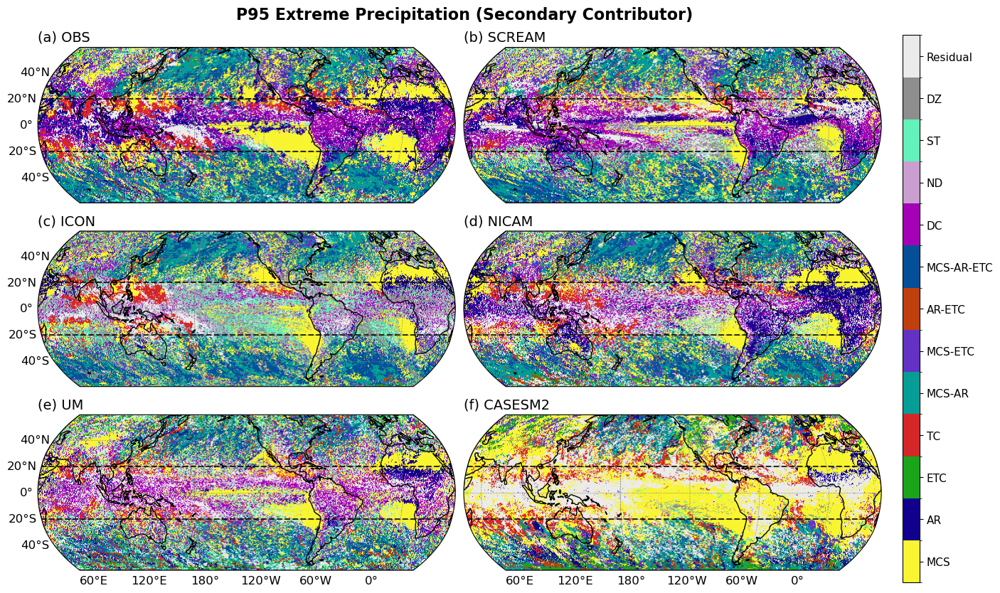

In [35]:
# Prepare data as 2D list
sources = ['obs', 'm1', 'm2', 'm3', 'm4', 'm5']
nrow = 3
ncol = 2

figtitle = f'{extreme_percentile.upper()} Extreme Precipitation (Secondary Contributor)'
figname = f'{figdir}globalmap_extreme_precip_{extreme_percentile.upper()}_rank2_types_annual.pdf'

# Create 2D lists for data and titles
da_list = []
titles = []
row_data = []
row_titles = []

for i, src in enumerate(sources):
    row_data.append(second_types_all.sel(source=src))
    row_titles.append(f'({chr(ord("a") + i)}) {name_map_plot[src]}')
    
    # Start new row after ncol panels
    if (i + 1) % ncol == 0 or i == len(sources) - 1:
        # Pad with None if needed for last row
        while len(row_data) < ncol:
            row_data.append(None)
            row_titles.append('')
        
        da_list.append(row_data)
        titles.append(row_titles)
        row_data = []
        row_titles = []

# Plot the grid
fig = plot_ranked_types_grid(
    da_list=da_list,
    titles=titles,
    figname=figname,
    figsize=figsize,
    fontsize=fontsize,
    cb_fontsize=cb_fontsize,
    wspace=wspace,
    hspace=hspace,
    show_gridlines=True,
    lon_label=lon_label, lat_label=lat_label,
    lat_range=lat_range,
    lat_lines=tropics_lat,
    figtitle=figtitle,
    dpi=300,
)

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof_extremerain/globalmap_extreme_precip_P95_rank2_types_annual_land.pdf


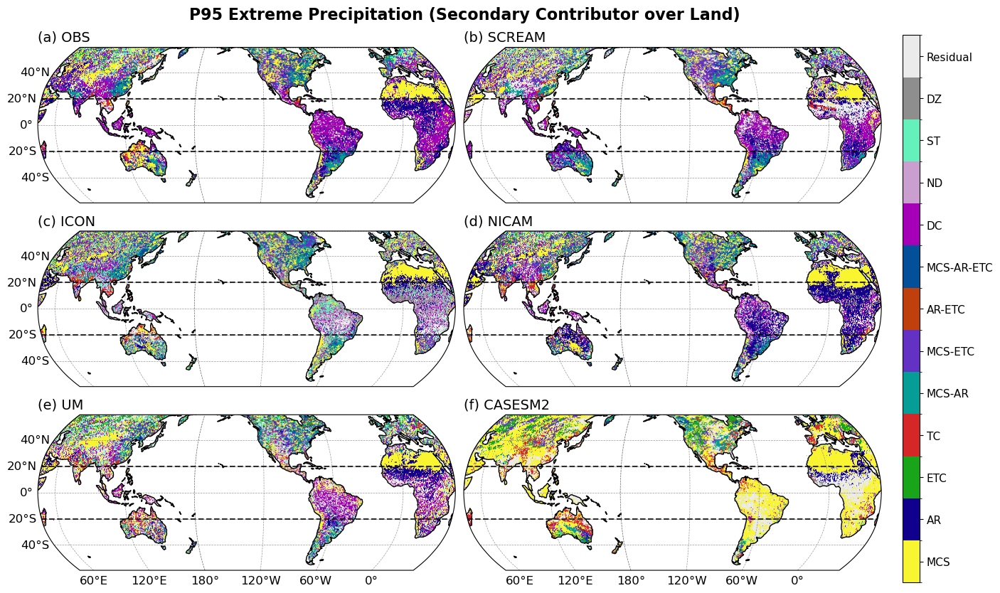

In [36]:
# Prepare data as 2D list
sources = ['obs', 'm1', 'm2', 'm3', 'm4', 'm5']
nrow = 3
ncol = 2

figtitle = f'{extreme_percentile.upper()} Extreme Precipitation (Secondary Contributor over Land)'
figname = f'{figdir}globalmap_extreme_precip_{extreme_percentile.upper()}_rank2_types_annual_land.pdf'

# Create 2D lists for data and titles
da_list = []
titles = []
row_data = []
row_titles = []

for i, src in enumerate(sources):
    row_data.append(second_types_all.sel(source=src).where(landfrac > land_thresh))
    row_titles.append(f'({chr(ord("a") + i)}) {name_map_plot[src]}')
    
    # Start new row after ncol panels
    if (i + 1) % ncol == 0 or i == len(sources) - 1:
        # Pad with None if needed for last row
        while len(row_data) < ncol:
            row_data.append(None)
            row_titles.append('')
        
        da_list.append(row_data)
        titles.append(row_titles)
        row_data = []
        row_titles = []

# Plot the grid
fig = plot_ranked_types_grid(
    da_list=da_list,
    titles=titles,
    figname=figname,
    figsize=figsize,
    fontsize=fontsize,
    cb_fontsize=cb_fontsize,
    wspace=wspace,
    hspace=hspace,
    show_gridlines=True,
    lon_label=lon_label, lat_label=lat_label,
    lat_range=lat_range,
    lat_lines=tropics_lat,
    figtitle=figtitle,
    dpi=300,
)

/global/common/software/m1867/python/hackathon/lib/python3.12/site-packages/numpy/_core/numeric.py:366: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')
/global/common/software/m1867/python/hackathon/lib/python3.12/site-packages/numpy/_core/numeric.py:366: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')
/global/common/software/m1867/python/hackathon/lib/python3.12/site-packages/numpy/_core/numeric.py:366: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')
/global/common/software/m1867/python/hackathon/lib/python3.12/site-packages/numpy/_core/numeric.py:366: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')
/global/common/software/m1867/python/hackathon/lib/python3.12/site-packages/numpy/_core/numeric.py:366: RuntimeWarning: invalid value encountered in cast
  multiarray.copyt

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof_extremerain/globalmap_extreme_precip_P95_rank3_types_annual.pdf


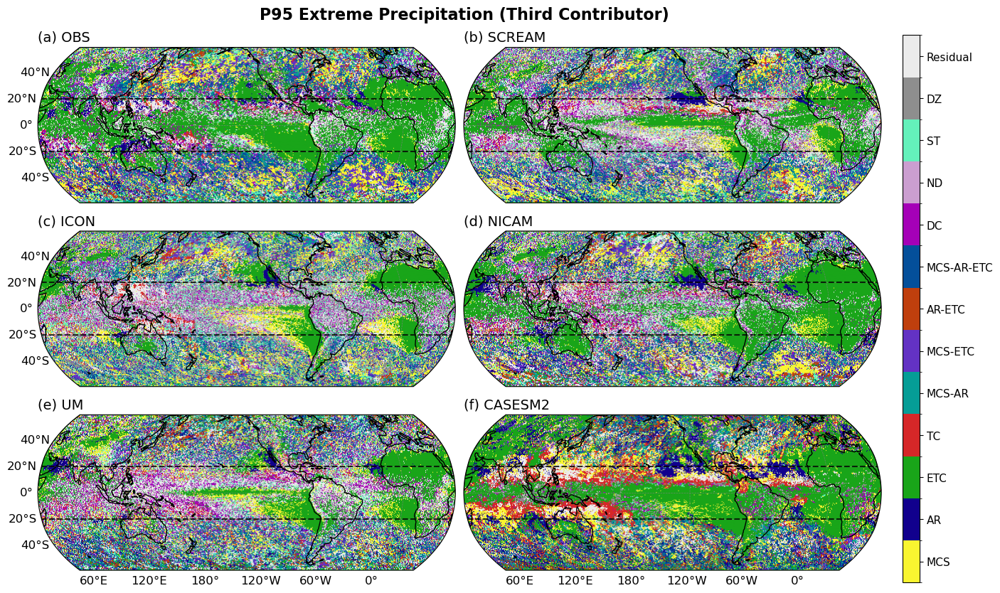

In [37]:
# Prepare data as 2D list
sources = ['obs', 'm1', 'm2', 'm3', 'm4', 'm5']
nrow = 3
ncol = 2

figtitle = f'{extreme_percentile.upper()} Extreme Precipitation (Third Contributor)'
figname = f'{figdir}globalmap_extreme_precip_{extreme_percentile.upper()}_rank3_types_annual.pdf'

# Create 2D lists for data and titles
da_list = []
titles = []
row_data = []
row_titles = []

for i, src in enumerate(sources):
    row_data.append(third_types_all.sel(source=src))
    row_titles.append(f'({chr(ord("a") + i)}) {name_map_plot[src]}')
    
    # Start new row after ncol panels
    if (i + 1) % ncol == 0 or i == len(sources) - 1:
        # Pad with None if needed for last row
        while len(row_data) < ncol:
            row_data.append(None)
            row_titles.append('')
        
        da_list.append(row_data)
        titles.append(row_titles)
        row_data = []
        row_titles = []

# Plot the grid
fig = plot_ranked_types_grid(
    da_list=da_list,
    titles=titles,
    figname=figname,
    figsize=figsize,
    fontsize=fontsize,
    cb_fontsize=cb_fontsize,
    wspace=wspace,
    hspace=hspace,
    show_gridlines=True,
    lon_label=lon_label, lat_label=lat_label,
    lat_range=lat_range,
    lat_lines=tropics_lat,
    figtitle=figtitle,
    dpi=300,
)

## Plot contribution fraction maps

In [38]:
def plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname, 
                  min_thresh=None, wspace=None, hspace=None, oob_colors=None, 
                  contourf=False, figsize=None, fontsize=None, cb_fontsize=None, 
                  lat_range=None, lat_label=None, lon_label=None,
                  show_gridlines=False, figtitle=None, dpi=200, lat_lines=None):
    """
    Plot a grid of maps with flexible dimensions
    
    Parameters:
    -----------
    da_list : list of lists
        2D list of xarray DataArrays to plot, dimensions should be [nrow][ncol]
    titles : list of lists
        2D list of titles for each panel, dimensions should be [nrow][ncol]
    levels, colormaps, etc.: can be single values applied to all panels or lists of lists matching da_list
    lat_range : tuple, optional
        (lat_min, lat_max) to clip display, e.g., (-60, 60)
    lat_lines : list, optional
        List of latitude values to plot as horizontal lines
    wspace : float, optional
        Width space between subplots
    hspace : float, optional
        Height space between subplots
    figsize : tuple, optional
        Figure size (width, height)
    fontsize : int, optional
        Font size for labels
    cb_fontsize : int, optional
        Font size for colorbar labels
    show_gridlines : bool, optional
        Whether to show gridlines
    lon_label : bool or list
        Show longitude labels on gridlines. Can be single bool or list matching data_arrays structure
    lat_label : bool or list
        Show latitude labels on gridlines. Can be single bool or list matching data_arrays structure
    """
    # Get grid dimensions from input data
    nrow = len(da_list)
    ncol = len(da_list[0]) if nrow > 0 else 0
    
    # Handle case where parameters might be the same for all panels
    def ensure_grid_format(param, param_name):
        if not isinstance(param, list):
            # If single value provided, apply to all panels
            return [[param for _ in range(ncol)] for _ in range(nrow)]
        elif isinstance(param, list):
            if len(param) == 0:
                # Empty list
                return [[[] for _ in range(ncol)] for _ in range(nrow)]
            elif isinstance(param[0], list):
                # Already a list of lists, return as is
                return param
            else:
                # It's a 1D list (like levels=[1,2,3,5,7,10]), use same list for all panels
                return [[param for _ in range(ncol)] for _ in range(nrow)]
        return param
    
    # Ensure all parameters have proper grid format
    colormaps = ensure_grid_format(colormaps, "colormaps")
    levels = ensure_grid_format(levels, "levels")
    cbticks = ensure_grid_format(cbticks, "cbticks")
    
    mpl.rcParams['font.size'] = fontsize
    map_extent = [0, 360, -60, 60]
    proj = ccrs.Robinson(central_longitude=225)
    data_proj = ccrs.PlateCarree()
    resolution = '110m'
    land = cf.NaturalEarthFeature('physical', 'land', resolution)
    ocean = cf.NaturalEarthFeature('physical', 'ocean', resolution)
    borders = cf.NaturalEarthFeature('cultural', 'admin_0_boundary_lines_land', resolution)

    fig = plt.figure(figsize=figsize, dpi=100)
    # Setup two columns (left: plots, right: colorbar)
    gs0 = gridspec.GridSpec(1, 2, figure=fig, height_ratios=[1], width_ratios=[1,0.02], wspace=0.05)
    # Setup panels to the left
    h_ratios = list(np.repeat(1, nrow))
    w_ratios = list(np.repeat(1, ncol))
    gs = gridspec.GridSpecFromSubplotSpec(nrow, ncol, subplot_spec=gs0[0], 
                                         height_ratios=h_ratios, width_ratios=w_ratios, 
                                         wspace=wspace, hspace=hspace)
    
    # Loop over each panel in the grid
    cf1 = None  # Will store the last plot for colorbar
    for row in range(nrow):
        for col in range(ncol):
            # Get panel index
            panel_idx = row * ncol + col

            # Get data for this panel
            Var = da_list[row][col]
            if Var is not None:
            
                # Create subplot
                ax = plt.subplot(gs[panel_idx], projection=proj)
                ax.set_global()
                ax.add_feature(land, facecolor='none', edgecolor='k', zorder=3)
                ax.set_aspect('auto', adjustable=None)
                
                # Add title
                ax.set_title(titles[row][col], fontsize=fontsize, loc='left')
                # flabel = ax.text(0.02, 0.94, titles[row][col], transform=ax.transAxes, fontsize=fontsize)
                # flabel.set_bbox(dict(facecolor='w', alpha=0.8, edgecolor='w'))           
                
                # Apply minimum threshold if provided
                if min_thresh is not None:
                    Var = Var.where(Var > min_thresh)
                
                # Setup colormap
                cmap = copy.copy(mpl.colormaps.get_cmap(colormaps[row][col]))
                
                # Set out-of-bounds colors
                if oob_colors is not None:
                    oob_c = oob_colors
                    if oob_c is not None:
                        cmap.set_over(oob_c['over'])
                        cmap.set_under(oob_c['under'])
                
                # Create color normalization
                norm = colors.BoundaryNorm(boundaries=levels[row][col], ncolors=cmap.N)
                
                # Plot data
                if not contourf:
                    cf1 = egh.healpix_show(Var, ax=ax, cmap=cmap, norm=norm, zorder=2)            
                else:
                    cf1 = egh.healpix_contour(Var, ax=ax, norm=norm, cmap=cmap, transform=data_proj, zorder=2)
                
                # Add latitude lines if specified
                if lat_lines is not None:
                    for lat in lat_lines:
                        # Create longitude array spanning the globe
                        lons = np.linspace(-180, 180, 361)
                        lats = np.full_like(lons, lat)
                        ax.plot(lons, lats, color='k', linestyle='--', linewidth=1.5, 
                            transform=data_proj, zorder=4, alpha=0.8)
                
                # Set latitude range if provided
                if lat_range is not None:
                    lat_min, lat_max = lat_range
                    _, y_min = proj.transform_point(0, lat_min, ccrs.PlateCarree())
                    _, y_max = proj.transform_point(0, lat_max, ccrs.PlateCarree())
                    ax.set_ylim([y_min, y_max])

                # Add gridlines
                if show_gridlines:
                    gl = ax.gridlines(draw_labels=lon_label[row][col] or lat_label[row][col], 
                                    linestyle='--', linewidth=0.5, color='gray', alpha=0.8, zorder=10)
                    
                    # Configure which labels to show
                    if lon_label[row][col] or lat_label[row][col]:
                        gl.top_labels = False
                        gl.right_labels = False
                        gl.bottom_labels = lon_label[row][col]
                        gl.left_labels = lat_label[row][col]
                        gl.xlabel_style = {'size': fontsize-2}
                        gl.ylabel_style = {'size': fontsize-2}
    
    # Add colorbar (using the last plotted data)
    if cf1 is not None:
        cax = plt.subplot(gs0[1])
        cbar = plt.colorbar(cf1, cax=cax, label=cblabels, ticks=cbticks[row][col], 
                           orientation='vertical', extend='both')
    
    # Add suptitle
    if figtitle:
        fig.suptitle(figtitle, y=0.92, fontweight='bold')
    
    # Save figure
    fig.savefig(figname, dpi=dpi, bbox_inches='tight', facecolor='w')
    return fig

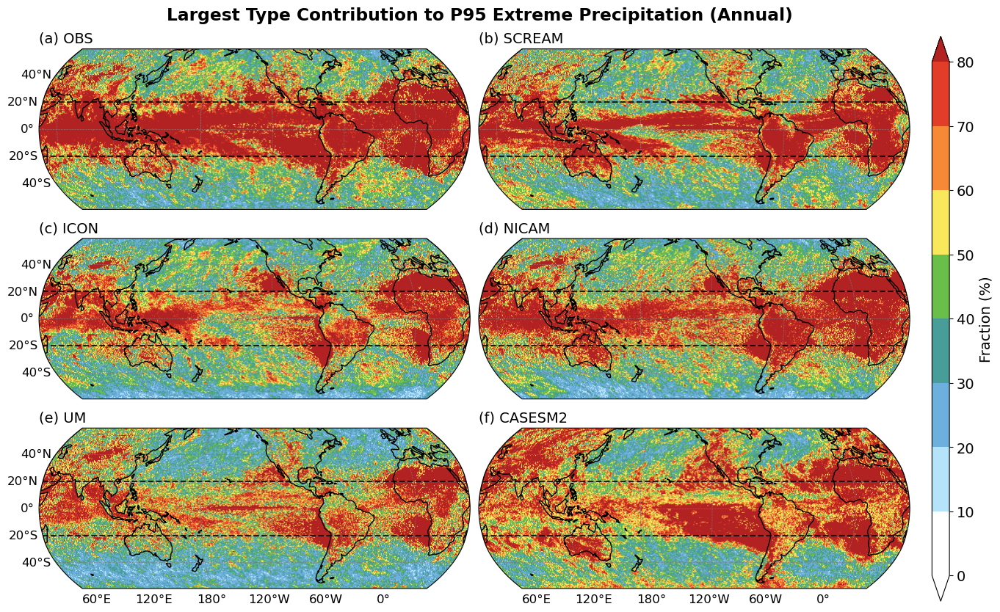

In [39]:
# Create 2D lists for data and titles
da_list = [
    [dominant_values_all_filtered.sel(source='obs'), dominant_values_all_filtered.sel(source='m1')],
    [dominant_values_all_filtered.sel(source='m2'), dominant_values_all_filtered.sel(source='m3')],
    [dominant_values_all_filtered.sel(source='m4'), dominant_values_all_filtered.sel(source='m5')],
]
titles = [
    [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
    [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
    [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
# figwidth = 14
# height_ratio_per_panel = 0.5
# figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
# figsize = [figwidth, figheight]
figsize = (16, 10)
fontsize = 14
# cb_fontsize = 11
wspace = 0.02
hspace = 0.02
lat_range = (-60, 60)
varname1 = 'Fraction'
units = '%'
figtitle = f'Largest Type Contribution to {extreme_percentile.upper()} Extreme Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = np.arange(0, 81, 10)
min_thresh = None
colormaps = cmaps.WhiteBlueGreenYellowRed
colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_extreme_precip_{extreme_percentile.upper()}_rank1_frac_annual.pdf'

# Configure gridline labels: show labels on leftmost column and bottom row
lon_label = [[False, False],
             [False, False],
             [True, True]]
lat_label = [[True, False],
             [True, False],
             [True, False],]

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
                    lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, dpi=200)

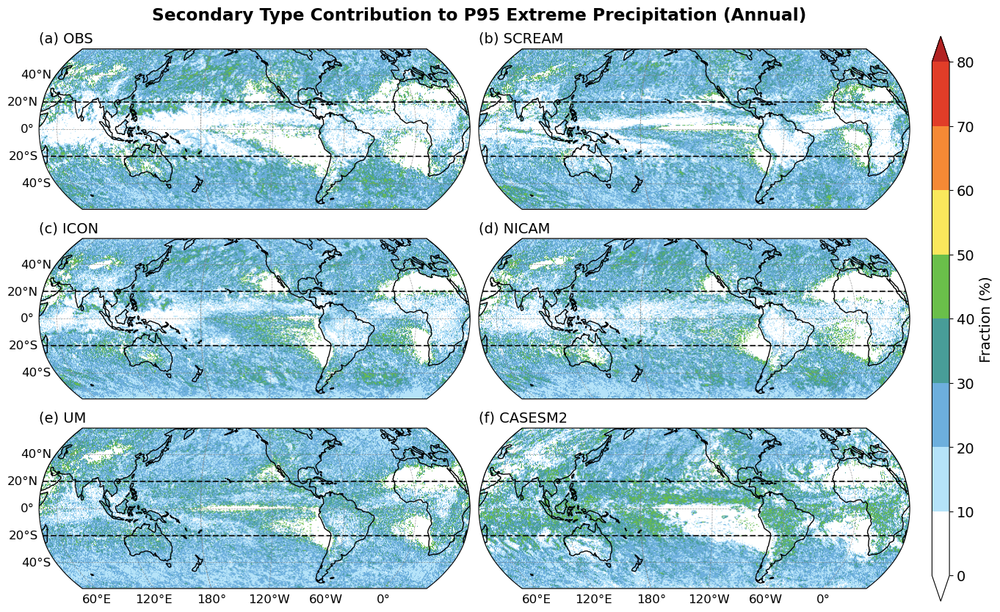

In [40]:
# Create 2D lists for data and titles
da_list = [
    [second_values_all_filtered.sel(source='obs'), second_values_all_filtered.sel(source='m1')],
    [second_values_all_filtered.sel(source='m2'), second_values_all_filtered.sel(source='m3')],
    [second_values_all_filtered.sel(source='m4'), second_values_all_filtered.sel(source='m5')],
]
titles = [
    [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
    [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
    [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
varname1 = 'Fraction'
units = '%'
figtitle = f'Secondary Type Contribution to {extreme_percentile.upper()} Extreme Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = np.arange(0, 81, 10)
min_thresh = None
colormaps = cmaps.WhiteBlueGreenYellowRed
colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_extreme_precip_{extreme_percentile.upper()}_rank2_frac_annual.pdf'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
                    lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, dpi=200)

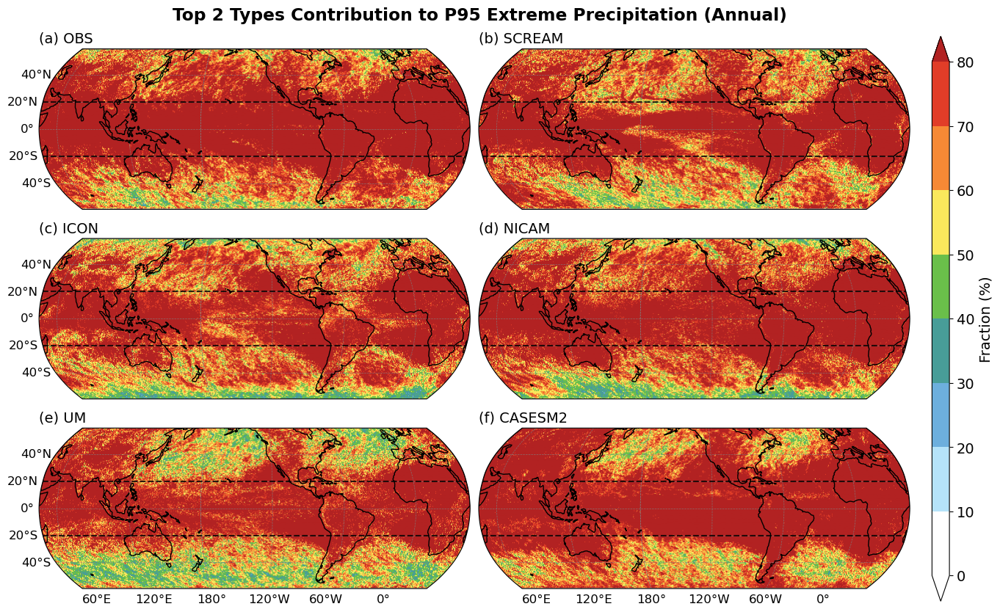

In [41]:
top2_values_all = dominant_values_all_filtered + second_values_all_filtered

# Create 2D lists for data and titles
da_list = [
    [top2_values_all.sel(source='obs'), top2_values_all.sel(source='m1')],
    [top2_values_all.sel(source='m2'), top2_values_all.sel(source='m3')],
    [top2_values_all.sel(source='m4'), top2_values_all.sel(source='m5')],
]
titles = [
    [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
    [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
    [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
varname1 = 'Fraction'
units = '%'
figtitle = f'Top 2 Types Contribution to {extreme_percentile.upper()} Extreme Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = np.arange(0, 81, 10)
min_thresh = None
colormaps = cmaps.WhiteBlueGreenYellowRed
colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_extreme_precip_{extreme_percentile.upper()}_rank12_frac_annual.pdf'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
                    lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, dpi=200)

## Combined 6 × 6 Pie-Chart Figure (Land/Ocean × Tropics/N.H./S.H. × Source)

Single figure collecting all regional × source pie charts:
- **Rows (6):** Land Tropics, Land N.H., Land S.H. | Ocean Tropics, Ocean N.H., Ocean S.H.
- **Columns (6):** one per dataset/source (OBS, SCREAM, ICON, UM, NICAM, CASESM2)
- **Annotations:** column titles above top row; rotated region labels (inner left); rotated bold group labels Land/Ocean (outer left, colored)
- **Colorbar:** vertical legend on the right showing all 13 categories


In [42]:
def plot_combined_pie_charts(
    region_data,
    region_order=None,
    source_order=None,
    region_row_labels=None,
    group_labels=None,
    source_col_titles=None,
    figsize=(22, 24),
    fontsize=10,
    min_display_pct=5.0,
    wspace=0.06,
    explode_offset=0.08,
    n_explode=1,
    pie_padding=0.1,
    divider_lw=3.0,
    divider_color='k',
    suptitle=None,
    title_y=0.995,
    figname=None,
):
    """
    Plot a 6-row × 6-column summary figure of pie charts.

    Layout
    ------
    Rows (6):   Land Tropics | Land N.H. | Land S.H.
                [thick divider]
                Ocean Tropics | Ocean N.H. | Ocean S.H.
    Columns (6): one per dataset/source

    Annotations:
      - Column titles above top row: (a) OBS, (b) SCREAM, …
      - Rotated region label (italic) at left of each row
      - Rotated bold coloured group label (Land/Ocean) spanning each 3-row block
      - Horizontal colorbar below the figure
      - Thick horizontal line between Land and Ocean groups
      - Top n_explode wedges are exploded outward
      - Percentage font size scales with rank (largest for #1, decreasing for top 3)

    Parameters
    ----------
    region_data : dict
        Keys match region_order; values are lists of 13 DataArrays:
          [mcs_iso, ar_iso, etc_iso, tc, mcs_ar, mcs_etc, ar_etc, mcs_ar_etc,
           dc, nd, st, dz, residual]
        Each DataArray must have a 'source' dimension.
    region_order : list of str, optional
        Row order (top → bottom).
    source_order : list of str, optional
        Column order (left → right).
    region_row_labels : dict, optional
        {region_key: label_text}
    group_labels : list of (text, color), optional
        Two (text, color) entries for the two 3-row blocks.
    source_col_titles : list of str, optional
        Column header text (above top row).
    figsize : tuple
    fontsize : int or float
    min_display_pct : float
        Minimum % threshold to print a label inside a wedge.
    wspace : float
        Horizontal space between columns.
    explode_offset : float
        How far each exploded wedge is shifted outward (0 = no explode).
    n_explode : int
        Number of largest wedges to explode outward. 1 = only the largest,
        3 = top 3, etc. 0 = no explode.
    pie_padding : float
        Extra margin beyond the pie edge (in data coords) used to set the axes
        limits. The pie circle has radius 1, so the axes range is set to
        ±(1 + explode_offset + pie_padding). Smaller values make the pie fill
        more of its axes box and reduce blank space between rows.
        Default 0.1 is a tight fit; increase if autopct labels are clipped.
    divider_lw : float
        Line width of the horizontal divider between Land and Ocean groups.
    divider_color : str
        Colour of the divider line.
    suptitle : str or None
    title_y : float
    figname : str or None

    Returns
    -------
    fig : matplotlib.figure.Figure
    """
    import matplotlib.gridspec as gridspec
    import matplotlib.lines as mlines
    from matplotlib.colors import ListedColormap, BoundaryNorm

    # ── Colour / label scheme ─────────────────────────────────────────────────
    cof_colors = [
        "#F9F530",      # 1: MCS_iso  - yellow
        "#11008d",      # 2: AR_iso   - dark blue
        "#19a519",      # 3: ETC_iso  - green
        '#d62728',      # 4: TC       - red
        "#059D96",      # 5: MCS_AR   - teal
        "#6332C4",      # 6: MCS_ETC  - purple
        "#BF3F0D",      # 7: AR_ETC   - brownish orange
        "#044F9A",      # 8: MCS_AR_ETC - dark blue
        "#A500B7",      # 9: DC       - dark purple
        "#CB9ED0",      # 10: ND      - light pink
        "#64F1BB",      # 11: ST      - mint green
        "#8E8E8E",      # 12: DZ      - gray
        "#E0E0E09F",    # 13: Residual - light gray
    ]
    cof_labels = [
        'MCS', 'AR', 'ETC', 'TC',
        'MCS-AR', 'MCS-ETC', 'AR-ETC', 'MCS-AR-ETC',
        'DC', 'ND', 'ST', 'DZ', 'Residual',
    ]

    # ── Defaults ──────────────────────────────────────────────────────────────
    if region_order is None:
        region_order = ['trop_l', 'nh_l', 'sh_l', 'trop_o', 'nh_o', 'sh_o']

    default_row_labels = ['Tropics', 'N.H.', 'S.H.', 'Tropics', 'N.H.', 'S.H.']
    if region_row_labels is None:
        region_row_labels = {k: default_row_labels[i]
                             for i, k in enumerate(region_order)}

    if group_labels is None:
        group_labels = [('Land', 'saddlebrown'), ('Ocean', 'dodgerblue')]

    if source_order is None:
        for reg in region_order:
            if reg in region_data and region_data[reg]:
                source_order = list(region_data[reg][0].source.values)
                break
    if source_order is None:
        raise ValueError("Cannot determine source_order; supply it explicitly.")

    n_rows = len(region_order)  # 6
    n_cols = len(source_order)  # 6
    n_groups = len(group_labels)           # 2
    rows_per_group = n_rows // n_groups    # 3

    if source_col_titles is None:
        letters = 'abcdefghijklmnopqrstuvwxyz'
        titles_out = []
        for j, s in enumerate(source_order):
            try:
                label = name_map_plot.get(s, s)
            except Exception:
                label = s
            titles_out.append(f'({letters[j]}) {label}')
        source_col_titles = titles_out

    # ── Figure geometry ───────────────────────────────────────────────────────
    LEFT_GROUP  = 0.040
    LEFT_REGION = 0.030
    LEFT_PAD    = 0.015
    CB_HEIGHT   = 0.02   # colorbar height (figure fraction)
    CB_BOTTOM   = 0.02    # gap below colorbar to figure bottom
    CB_GAP      = 0.015   # gap between colorbar and bottom of GridSpec
    BOTTOM_GS   = CB_BOTTOM + CB_HEIGHT + CB_GAP

    TOP_TITLE   = 0.025   # space above GridSpec for column titles
    TOP_GS      = (0.96 if suptitle is None else 0.93) - TOP_TITLE

    # GridSpec has n_rows data rows + (n_groups-1) thin separator rows
    # height_ratios: [1,1,1, sep, 1,1,1]  where sep << 1
    SEP_RATIO = 0.04
    hr = []
    for grp in range(n_groups):
        hr.extend([1] * rows_per_group)
        if grp < n_groups - 1:
            hr.append(SEP_RATIO)
    n_gs_rows = len(hr)  # 7

    # Map data row index → GridSpec row index
    def gs_row(data_row_idx):
        grp = data_row_idx // rows_per_group
        within = data_row_idx % rows_per_group
        return grp * (rows_per_group + 1) + within

    fig = plt.figure(figsize=figsize)
    fig.set_constrained_layout(False)

    gs = gridspec.GridSpec(
        n_gs_rows, n_cols,
        left=LEFT_GROUP + LEFT_REGION + LEFT_PAD,
        right=0.98,
        top=TOP_GS,
        bottom=BOTTOM_GS,
        hspace=0.0,
        wspace=wspace,
        height_ratios=hr,
    )

    # Axes limits for each pie: tighten to reduce blank space around the circle.
    # ax.pie() draws in data coords with circle radius=1; matplotlib defaults to
    # ±1.25.  Setting a tighter bound forces the pie to fill more of its axes
    # box and eliminates the extra vertical whitespace between rows.
    r_lim = 1.0 + explode_offset + pie_padding

    # ── Pie chart axes ────────────────────────────────────────────────────────
    # axes keyed by (data_row, col)
    axes = {}
    for row_idx, region_key in enumerate(region_order):
        da_list = region_data.get(region_key)
        for col_idx, src in enumerate(source_order):
            ax = fig.add_subplot(gs[gs_row(row_idx), col_idx])
            axes[(row_idx, col_idx)] = ax

            if da_list is None:
                ax.text(0.5, 0.5, 'N/A', ha='center', va='center',
                        transform=ax.transAxes, fontsize=fontsize, color='gray')
                ax.axis('off')
                continue

            # Extract values
            pie_data = []
            for da in da_list:
                try:
                    pie_data.append(max(0.0, float(da.sel(source=src).values)))
                except Exception:
                    pie_data.append(0.0)

            # Sort largest-first, filter tiny slices
            order = np.argsort(pie_data)[::-1]
            filtered = [(pie_data[i], cof_colors[i], cof_labels[i])
                        for i in order if pie_data[i] >= 0.1]
            if not filtered:
                ax.text(0.5, 0.5, 'No data', ha='center', va='center',
                        transform=ax.transAxes, fontsize=fontsize - 2, color='gray')
                ax.axis('off')
                continue

            vals, cols, labs = zip(*filtered)

            # Explode the top n_explode wedges (sorted largest-first)
            explode = [explode_offset if i < n_explode else 0.0
                       for i in range(len(vals))]

            # Custom autopct: show percentage only
            def _autopct(pct, _thr=min_display_pct):
                if pct >= _thr:
                    return f'{pct:.0f}%'
                return ''

            wedges, _, atexts = ax.pie(
                vals, colors=cols, autopct=_autopct,
                explode=explode,
                startangle=90, counterclock=False,
                textprops={'fontsize': fontsize - 2, 'weight': 'bold'},
            )

            # Tighten axes limits so the pie fills the box, removing blank space
            ax.set_xlim(-r_lim, r_lim)
            ax.set_ylim(-r_lim, r_lim)

            # ── Rank-based font sizes for autopct text ────────────────────────
            # Rank 0 (largest) → fontsize+1, rank 1 → fontsize, rank 2 → fontsize-1,
            # rank 3+ → fontsize-2 (default). Tiny slices are capped smaller.
            rank_fontsizes = [fontsize + 1, fontsize, fontsize - 1]
            for rank, (w, at) in enumerate(zip(wedges, atexts)):
                pct = abs(w.theta2 - w.theta1) / 360. * 100.
                base_fs = rank_fontsizes[rank] if rank < len(rank_fontsizes) else fontsize - 2
                if pct < 5:
                    base_fs = min(base_fs, max(5, fontsize - 5))
                elif pct < 10:
                    base_fs = min(base_fs, fontsize - 3)
                at.set_fontsize(base_fs)

            # # ── Type labels just outside pie for exploded wedges ──────────────
            # # Place a short label in the direction of the wedge mid-angle,
            # # just beyond the exploded edge; colour matches the wedge.
            # for rank, (w, lab) in enumerate(zip(wedges, labs)):
            #     if rank >= n_explode:
            #         break
            #     mid_angle = np.radians((w.theta1 + w.theta2) / 2)
            #     r_text = 1.0 + explode_offset + 0.22
            #     x = r_text * np.cos(mid_angle)
            #     y = r_text * np.sin(mid_angle)
            #     ha = 'left' if np.cos(mid_angle) >= 0 else 'right'
            #     short = (lab.replace('MCS-AR-ETC', 'M-A-E')
            #                 .replace('Residual', 'Res'))
            #     ax.text(x, y, short,
            #             ha=ha, va='center',
            #             fontsize=fontsize - 2, fontweight='bold',
            #             color=w.get_facecolor(),
            #             clip_on=False)

    # Force layout to settle before reading positions
    fig.canvas.draw()

    # ── Column titles (above top row) ─────────────────────────────────────────
    for col_idx, col_title in enumerate(source_col_titles):
        pos = axes[(0, col_idx)].get_position()
        x_center = (pos.x0 + pos.x1) / 2
        fig.text(x_center, pos.y1 + 0.005, col_title,
                 ha='center', va='bottom',
                 fontsize=fontsize*1.3, fontweight='bold')

    # ── Region labels (inner-left, rotated 90° CCW) ───────────────────────────
    for row_idx, region_key in enumerate(region_order):
        pos = axes[(row_idx, 0)].get_position()
        y_center = (pos.y0 + pos.y1) / 2
        x_region = pos.x0 - 0.015
        fig.text(x_region, y_center,
                 region_row_labels.get(region_key, ''),
                 ha='center', va='center',
                 fontsize=fontsize*1.3, rotation=90, fontweight='bold')

    # ── Group labels (outer-left, rotated 90° CCW) ────────────────────────────
    for grp_idx, (grp_text, grp_color) in enumerate(group_labels):
        start_row = grp_idx * rows_per_group
        end_row   = start_row + rows_per_group - 1
        pos_top = axes[(start_row, 0)].get_position()
        pos_bot = axes[(end_row,   0)].get_position()
        y_center = (pos_top.y1 + pos_bot.y0) / 2
        x_group  = pos_top.x0 - 0.042
        fig.text(x_group, y_center, grp_text,
                 ha='center', va='center',
                 fontsize=fontsize*2, fontweight='bold',
                 color=grp_color, rotation=90)

    # ── Thick horizontal divider between Land and Ocean groups ────────────────
    # Position it at the vertical midpoint between the last Land row and
    # the first Ocean row axes.
    last_land_pos  = axes[(rows_per_group - 1, 0)].get_position()
    first_ocean_pos = axes[(rows_per_group,    0)].get_position()
    y_divider = (last_land_pos.y0 + first_ocean_pos.y1) / 2

    x_line_left  = axes[(0, 0)].get_position().x0 - 0.055   # extend to group label
    x_line_right = axes[(0, n_cols - 1)].get_position().x1

    divider_line = mlines.Line2D(
        [x_line_left, x_line_right], [y_divider, y_divider],
        transform=fig.transFigure,
        color=divider_color, linewidth=divider_lw,
        clip_on=False, zorder=10,
    )
    fig.add_artist(divider_line)

    # ── Horizontal colorbar at the bottom ────────────────────────────────────
    gs_left  = axes[(0, 0)].get_position().x0
    gs_right = axes[(0, n_cols - 1)].get_position().x1
    cb_width = gs_right - gs_left
    cax = fig.add_axes([gs_left, CB_BOTTOM, cb_width, CB_HEIGHT])

    cof_cmap = ListedColormap(cof_colors)
    cof_norm = BoundaryNorm(boundaries=np.arange(0.5, 14.5, 1), ncolors=13)
    sm = plt.cm.ScalarMappable(cmap=cof_cmap, norm=cof_norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal',
                        ticks=np.arange(1, 14))
    cbar.ax.set_xticklabels(cof_labels, fontsize=fontsize*1.2, rotation=30, ha='right')
    cbar.outline.set_visible(True)

    # ── Suptitle ──────────────────────────────────────────────────────────────
    if suptitle is not None:
        fig.suptitle(suptitle,
                     fontsize=fontsize * 2, fontweight='bold', y=title_y)

    # ── Save ──────────────────────────────────────────────────────────────────
    if figname is not None:
        fig.savefig(figname, dpi=150, bbox_inches='tight', facecolor='white')
        print(f'Figure saved: {figname}')

    return fig


Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof_extremerain/PieChart_StormType_Fraction_P95_6x6_combined.pdf


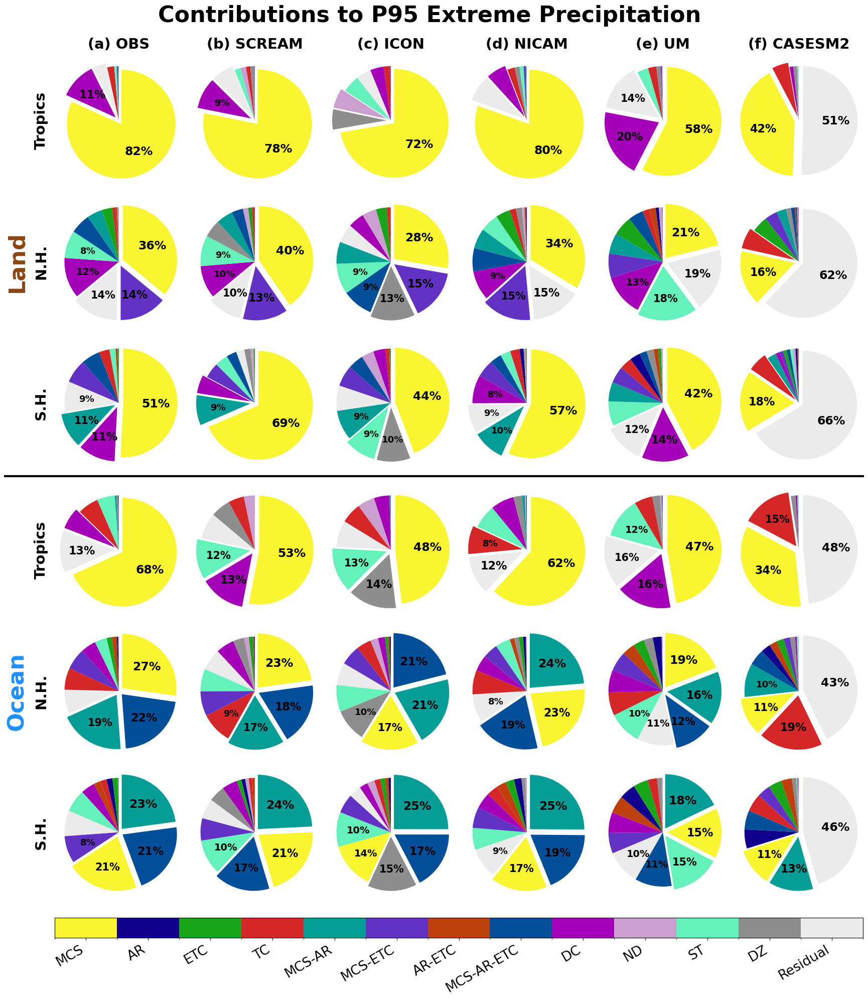

In [43]:
# ── Assemble region data: keys → list of 13 DataArrays (standard order) ──────
# Standard order: mcs_iso, ar_iso, etc_iso, tc, mcs_ar, mcs_etc, ar_etc,
#                 mcs_ar_etc, dc, nd, st, dz, residual

region_data = {
    # Land regions
    'trop_l': [
        mcs_iso_frac_trop_l_avg, ar_iso_frac_trop_l_avg, etc_iso_frac_trop_l_avg,
        tc_frac_trop_l_avg, mcs_ar_frac_trop_l_avg, mcs_etc_frac_trop_l_avg,
        ar_etc_frac_trop_l_avg, mcs_ar_etc_frac_trop_l_avg,
        dc_frac_trop_l_avg, nd_frac_trop_l_avg, st_frac_trop_l_avg,
        dz_frac_trop_l_avg, res_frac_trop_l_avg,
    ],
    'nh_l': [
        mcs_iso_frac_nh_l, ar_iso_frac_nh_l, etc_iso_frac_nh_l,
        tc_frac_nh_l, mcs_ar_frac_nh_l, mcs_etc_frac_nh_l,
        ar_etc_frac_nh_l, mcs_ar_etc_frac_nh_l,
        dc_frac_nh_l, nd_frac_nh_l, st_frac_nh_l,
        dz_frac_nh_l, res_frac_nh_l,
    ],
    'sh_l': [
        mcs_iso_frac_sh_l, ar_iso_frac_sh_l, etc_iso_frac_sh_l,
        tc_frac_sh_l, mcs_ar_frac_sh_l, mcs_etc_frac_sh_l,
        ar_etc_frac_sh_l, mcs_ar_etc_frac_sh_l,
        dc_frac_sh_l, nd_frac_sh_l, st_frac_sh_l,
        dz_frac_sh_l, res_frac_sh_l,
    ],
    # Ocean regions
    'trop_o': [
        mcs_iso_frac_trop_o_avg, ar_iso_frac_trop_o_avg, etc_iso_frac_trop_o_avg,
        tc_frac_trop_o_avg, mcs_ar_frac_trop_o_avg, mcs_etc_frac_trop_o_avg,
        ar_etc_frac_trop_o_avg, mcs_ar_etc_frac_trop_o_avg,
        dc_frac_trop_o_avg, nd_frac_trop_o_avg, st_frac_trop_o_avg,
        dz_frac_trop_o_avg, res_frac_trop_o_avg,
    ],
    'nh_o': [
        mcs_iso_frac_nh_o, ar_iso_frac_nh_o, etc_iso_frac_nh_o,
        tc_frac_nh_o, mcs_ar_frac_nh_o, mcs_etc_frac_nh_o,
        ar_etc_frac_nh_o, mcs_ar_etc_frac_nh_o,
        dc_frac_nh_o, nd_frac_nh_o, st_frac_nh_o,
        dz_frac_nh_o, res_frac_nh_o,
    ],
    'sh_o': [
        mcs_iso_frac_sh_o, ar_iso_frac_sh_o, etc_iso_frac_sh_o,
        tc_frac_sh_o, mcs_ar_frac_sh_o, mcs_etc_frac_sh_o,
        ar_etc_frac_sh_o, mcs_ar_etc_frac_sh_o,
        dc_frac_sh_o, nd_frac_sh_o, st_frac_sh_o,
        dz_frac_sh_o, res_frac_sh_o,
    ],
}

fig = plot_combined_pie_charts(
    region_data=region_data,
    region_order=['trop_l', 'nh_l', 'sh_l', 'trop_o', 'nh_o', 'sh_o'],
    suptitle=f'Contributions to {extreme_percentile.upper()} Extreme Precipitation',
    title_y=0.95,
    figsize=(18, 20),
    fontsize=16,
    min_display_pct=8.0,
    n_explode=3,
    pie_padding=0.1,
    # hspace=0.06,
    wspace=0.06,
    figname=f'{figdir}PieChart_StormType_Fraction_{extreme_percentile.upper()}_6x6_combined.pdf',
)
plt.show()


## Function to plot multi-panel pie charts

In [44]:
def plot_multipanel_pie_charts(data_arrays_list, nrow, ncol, 
                               suptitle=None, titles=None, figsize=None, show_colorbar=False, fontsize=10,
                               min_display_pct=2.0, hspace=0.3, wspace=0.3):
    """
    Plot nrow x ncol pie charts arranged using GridSpec.
    
    Parameters:
    -----------
    data_arrays_list : list of xarray.DataArray
        List of DataArrays containing storm type fractions with 'source' dimension.
        Should be in order: [mcs_iso, ar_iso, etc_iso, tc, mcs_ar, mcs_etc, ar_etc, 
                            mcs_ar_etc, dc, nd, st, dz, residual]
    nrow : int
        Number of rows in the panel
    ncol : int
        Number of columns in the panel
    colors : list
        List of colors for each storm type (13 types)
    labels : list
        List of labels for each storm type (13 types)
    titles : list, optional
        List of panel titles. If None, uses source coordinate values
    figsize : tuple, optional
        Figure size (width, height). If None, auto-calculated
    show_colorbar : bool, optional
        Whether to show a colorbar legend for storm types
    min_display_pct : float, optional
        Minimum percentage to display label inside pie (default: 2.0%)
    
    Returns:
    --------
    fig, axes : matplotlib figure and axes objects
    """

    # Define colors for each type with visual hierarchy
    cof_colors = [
        "#F9F530",  # 1: MCS_iso - yellow
        "#11008d",  # 2: AR_iso - dark blue
        "#19a519",  # 3: ETC_iso - green
        '#d62728',  # 4: TC - red
        "#059D96",  # 5: MCS_AR - teal/cyan
        "#6332C4",  # 6: MCS_ETC - purple
        "#BF3F0D",  # 7: AR_ETC - brownish orange
        "#044F9A",  # 8: MCS_AR_ETC - dark blue
        "#A500B7",  # 9: DC - dark purple
        "#CB9ED0",  # 10: ND - light purple/pink
        "#64F1BB",  # 11: ST - mint green
        "#8E8E8E",  # 12: DZ - gray
        "#E0E0E09F",  # 13: Residual - light gray
    ]
    # Define labels for colorbar
    cof_labels = ['MCS', 'AR', 'ETC', 'TC', 
                'MCS-AR', 'MCS-ETC', 'AR-ETC', 'MCS-AR-ETC', 
                'DC', 'ND', 'ST', 'DZ', 'Residual']

    # Get sources from the first DataArray
    sources = data_arrays_list[0].source.values
    n_sources = len(sources)
    
    # Check if we have enough panels
    n_panels = nrow * ncol
    if n_panels < n_sources:
        print(f"Warning: {n_sources} sources but only {n_panels} panels. "
              f"Some sources will not be displayed.")
    
    # Auto-calculate figure size if not provided
    if figsize is None:
        panel_size = 3.5  # inches per panel
        figsize = (ncol * panel_size, nrow * panel_size)
    
    # Create figure and GridSpec
    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(nrow, ncol, figure=fig, hspace=hspace, wspace=wspace)
    
    # Loop through sources and create pie charts
    for idx, source in enumerate(sources):
        if idx >= n_panels:
            break
            
        # Calculate subplot position
        row_idx = idx // ncol
        col_idx = idx % ncol
        
        # Create subplot
        ax = fig.add_subplot(gs[row_idx, col_idx])
        
        # Extract data for this source from all storm types
        pie_data = []
        for da in data_arrays_list:
            value = float(da.sel(source=source).values)
            pie_data.append(value)
        
        # Sort data by size (largest first) and keep track of original indices
        sorted_indices = np.argsort(pie_data)[::-1]  # Descending order
        sorted_data = [pie_data[i] for i in sorted_indices]
        sorted_colors = [cof_colors[i] for i in sorted_indices]
        sorted_labels = [cof_labels[i] for i in sorted_indices]
        
        # Filter out very small values (< 0.1%) to avoid clutter
        display_threshold = 0.1
        filtered_data = []
        filtered_colors = []
        filtered_labels = []
        
        for i, val in enumerate(sorted_data):
            if val >= display_threshold:
                filtered_data.append(val)
                filtered_colors.append(sorted_colors[i])
                filtered_labels.append(sorted_labels[i])
        
        # Create custom autopct function that shows labels only for slices > min_display_pct
        # Use a counter to track which wedge we're labeling to avoid confusion with similar values
        wedge_counter = {'count': 0}
        
        def make_autopct(values, labels_list, threshold=min_display_pct):
            def my_autopct(pct):
                # Get the current wedge index
                idx = wedge_counter['count']
                wedge_counter['count'] += 1
                
                if pct >= threshold and idx < len(labels_list):
                    label = labels_list[idx]
                    # Use shorter names for space
                    label_short = label.replace('Residual', 'Res').replace('MCS-AR-ETC', 'M-A-E')
                    return f'{label_short}\n({pct:.0f}%)'
                return ''
            return my_autopct
        
        # Plot pie chart
        wedges, texts, autotexts = ax.pie(
            filtered_data, 
            colors=filtered_colors,
            autopct=make_autopct(filtered_data, filtered_labels, threshold=min_display_pct),
            startangle=90,
            counterclock=False,
            textprops={'fontsize': fontsize, 'weight': 'bold'}
        )
        
        # Adjust font size for smaller wedges
        for i, (wedge, autotext) in enumerate(zip(wedges, autotexts)):
            pct = 100. * filtered_data[i] / sum(filtered_data)
            if pct < 5:
                autotext.set_fontsize(7)
            elif pct < 10:
                autotext.set_fontsize(8)
        
        # Set title (use custom title or source name)
        if titles is not None and idx < len(titles):
            title = titles[idx]
        else:
            # Try to use name_map_plot if available, otherwise use source directly
            try:
                title = name_map_plot.get(source, source)
            except:
                title = source
        
        ax.set_title(title, fontsize=fontsize*1.8, fontweight='bold')
    
    # Optional: Add colorbar/legend for storm types
    if show_colorbar:
        # Create legend patches
        legend_patches = [Patch(facecolor=cof_colors[i], label=cof_labels[i]) 
                         for i in range(len(cof_labels))]
        
        # Add legend below the figure
        fig.legend(handles=legend_patches, loc='lower center', 
                  ncol=7, fontsize=fontsize, frameon=True,
                  bbox_to_anchor=(0.5, -0.02))
        plt.subplots_adjust(bottom=0.12)
    
    # Set super title if provided
    if suptitle is not None:
        fig.suptitle(suptitle, fontsize=fontsize*1.6, fontweight='bold')
    
    return fig, gs

In [45]:
# # Tropical region storm type contributions for all 6 sources
# pie_da_list = [
#     mcs_iso_frac_trop_avg,
#     ar_iso_frac_trop_avg,
#     etc_iso_frac_trop_avg,
#     tc_frac_trop_avg,
#     mcs_ar_frac_trop_avg,
#     mcs_etc_frac_trop_avg,
#     ar_etc_frac_trop_avg,
#     mcs_ar_etc_frac_trop_avg,
#     dc_frac_trop_avg,
#     nd_frac_trop_avg,
#     st_frac_trop_avg,
#     dz_frac_trop_avg,
#     res_frac_trop_avg,
# ]
# suptitle = f'Contributions to {extreme_percentile.upper()} Extreme Precipitation\n(Tropics)'

# # Each data array in pie_da_list has dimension (source) with 6 values
# fig, gs = plot_multipanel_pie_charts(
#     data_arrays_list=pie_da_list,    # List of 13 DataArrays (storm types)
#     nrow=3,                            # 2 rows
#     ncol=2,                            # 3 columns (for 6 sources)
#     suptitle=suptitle,                 # Super title for the figure
#     titles=None,                       # Auto-generate from source coordinate
#     fontsize=14,
#     figsize=(10, 16),                  # Figure size
#     show_colorbar=False,                # Show legend
#     min_display_pct=3.0,                # Only label slices >= 2%
#     hspace=0.15, wspace=0.05,
# )
# plt.savefig(f'{figdir}/PieChart_StormType_Fraction_{extreme_percentile.upper()}_tropics_all.pdf', 
#             dpi=150, bbox_inches='tight', facecolor='white')
# plt.show()

In [46]:
# # Tropical region storm type contributions for all 6 sources
# pie_da_list = [
#     mcs_iso_frac_trop_l_avg,
#     ar_iso_frac_trop_l_avg,
#     etc_iso_frac_trop_l_avg,
#     tc_frac_trop_l_avg,
#     mcs_ar_frac_trop_l_avg,
#     mcs_etc_frac_trop_l_avg,
#     ar_etc_frac_trop_l_avg,
#     mcs_ar_etc_frac_trop_l_avg,
#     dc_frac_trop_l_avg,
#     nd_frac_trop_l_avg,
#     st_frac_trop_l_avg,
#     dz_frac_trop_l_avg,
#     res_frac_trop_l_avg,
# ]
# suptitle = f'Contributions to {extreme_percentile.upper()} Extreme Precipitation\n(Tropical Land)'

# # Each data array in pie_da_list has dimension (source) with 6 values
# fig, gs = plot_multipanel_pie_charts(
#     data_arrays_list=pie_da_list,    # List of 13 DataArrays (storm types)
#     nrow=3,                            # 2 rows
#     ncol=2,                            # 3 columns (for 6 sources)
#     suptitle=suptitle,                 # Super title for the figure
#     titles=None,                       # Auto-generate from source coordinate
#     fontsize=14,
#     figsize=(10, 16),                  # Figure size
#     show_colorbar=False,                # Show legend
#     min_display_pct=3.0,                # Only label slices >= 2%
#     hspace=0.15, wspace=0.05,
# )
# plt.savefig(f'{figdir}/PieChart_StormType_Fraction_{extreme_percentile.upper()}_tropical_land.pdf', 
#             dpi=150, bbox_inches='tight', facecolor='white')
# plt.show()

In [47]:
# # Tropical region storm type contributions for all 6 sources
# pie_da_list = [
#     mcs_iso_frac_trop_o_avg,
#     ar_iso_frac_trop_o_avg,
#     etc_iso_frac_trop_o_avg,
#     tc_frac_trop_o_avg,
#     mcs_ar_frac_trop_o_avg,
#     mcs_etc_frac_trop_o_avg,
#     ar_etc_frac_trop_o_avg,
#     mcs_ar_etc_frac_trop_o_avg,
#     dc_frac_trop_o_avg,
#     nd_frac_trop_o_avg,
#     st_frac_trop_o_avg,
#     dz_frac_trop_o_avg,
#     res_frac_trop_o_avg,
# ]
# suptitle = f'Contributions to {extreme_percentile.upper()} Extreme Precipitation\n(Tropical Ocean)'

# # Each data array in pie_da_list has dimension (source) with 6 values
# fig, gs = plot_multipanel_pie_charts(
#     data_arrays_list=pie_da_list,    # List of 13 DataArrays (storm types)
#     nrow=3,                            # 2 rows
#     ncol=2,                            # 3 columns (for 6 sources)
#     suptitle=suptitle,                 # Super title for the figure
#     titles=None,                       # Auto-generate from source coordinate
#     fontsize=14,
#     figsize=(10, 16),                  # Figure size
#     show_colorbar=False,                # Show legend
#     min_display_pct=3.0,                # Only label slices >= 2%
#     hspace=0.15, wspace=0.05,
# )
# plt.savefig(f'{figdir}/PieChart_StormType_Fraction_{extreme_percentile.upper()}_tropical_ocean.pdf', 
#             dpi=150, bbox_inches='tight', facecolor='white')
# plt.show()

In [48]:
# # Tropical region storm type contributions for all 6 sources
# pie_da_list = [
#     mcs_iso_frac_nh_l,
#     ar_iso_frac_nh_l,
#     etc_iso_frac_nh_l,
#     tc_frac_nh_l,
#     mcs_ar_frac_nh_l,
#     mcs_etc_frac_nh_l,
#     ar_etc_frac_nh_l,
#     mcs_ar_etc_frac_nh_l,
#     dc_frac_nh_l,
#     nd_frac_nh_l,
#     st_frac_nh_l,
#     dz_frac_nh_l,
#     res_frac_nh_l,
# ]
# suptitle = f'Contributions to {extreme_percentile.upper()} Extreme Precipitation\n(N.H. Land)'

# # Each data array in pie_da_list has dimension (source) with 6 values
# fig, gs = plot_multipanel_pie_charts(
#     data_arrays_list=pie_da_list,    # List of 13 DataArrays (storm types)
#     nrow=3,                            # 2 rows
#     ncol=2,                            # 3 columns (for 6 sources)
#     suptitle=suptitle,                 # Super title for the figure
#     titles=None,                       # Auto-generate from source coordinate
#     fontsize=14,
#     figsize=(10, 16),                  # Figure size
#     show_colorbar=False,                # Show legend
#     min_display_pct=3.0,                # Only label slices >= 2%
#     hspace=0.15, wspace=0.05,
# )
# plt.savefig(f'{figdir}/PieChart_StormType_Fraction_{extreme_percentile.upper()}_NH_land.pdf', 
#             dpi=150, bbox_inches='tight', facecolor='white')
# plt.show()

In [49]:
# # Tropical region storm type contributions for all 6 sources
# pie_da_list = [
#     mcs_iso_frac_nh_o,
#     ar_iso_frac_nh_o,
#     etc_iso_frac_nh_o,
#     tc_frac_nh_o,
#     mcs_ar_frac_nh_o,
#     mcs_etc_frac_nh_o,
#     ar_etc_frac_nh_o,
#     mcs_ar_etc_frac_nh_o,
#     dc_frac_nh_o,
#     nd_frac_nh_o,
#     st_frac_nh_o,
#     dz_frac_nh_o,
#     res_frac_nh_o,
# ]
# suptitle = f'Contributions to {extreme_percentile.upper()} Extreme Precipitation\n(N.H. Ocean)'

# # Each data array in pie_da_list has dimension (source) with 6 values
# fig, gs = plot_multipanel_pie_charts(
#     data_arrays_list=pie_da_list,    # List of 13 DataArrays (storm types)
#     nrow=3,                            # 2 rows
#     ncol=2,                            # 3 columns (for 6 sources)
#     suptitle=suptitle,                 # Super title for the figure
#     titles=None,                       # Auto-generate from source coordinate
#     fontsize=14,
#     figsize=(10, 16),                  # Figure size
#     show_colorbar=False,                # Show legend
#     min_display_pct=3.0,                # Only label slices >= 2%
#     hspace=0.15, wspace=0.05,
# )
# plt.savefig(f'{figdir}/PieChart_StormType_Fraction_{extreme_percentile.upper()}_NH_ocean.pdf', 
#             dpi=150, bbox_inches='tight', facecolor='white')
# plt.show()

In [50]:
# # Tropical region storm type contributions for all 6 sources
# pie_da_list = [
#     mcs_iso_frac_sh_l,
#     ar_iso_frac_sh_l,
#     etc_iso_frac_sh_l,
#     tc_frac_sh_l,
#     mcs_ar_frac_sh_l,
#     mcs_etc_frac_sh_l,
#     ar_etc_frac_sh_l,
#     mcs_ar_etc_frac_sh_l,
#     dc_frac_sh_l,
#     nd_frac_sh_l,
#     st_frac_sh_l,
#     dz_frac_sh_l,
#     res_frac_sh_l,
# ]
# suptitle = f'Contributions to {extreme_percentile.upper()} Extreme Precipitation\n(S.H. Land)'

# # Each data array in pie_da_list has dimension (source) with 6 values
# fig, gs = plot_multipanel_pie_charts(
#     data_arrays_list=pie_da_list,    # List of 13 DataArrays (storm types)
#     nrow=3,                            # 2 rows
#     ncol=2,                            # 3 columns (for 6 sources)
#     suptitle=suptitle,                 # Super title for the figure
#     titles=None,                       # Auto-generate from source coordinate
#     fontsize=14,
#     figsize=(10, 16),                  # Figure size
#     show_colorbar=False,                # Show legend
#     min_display_pct=3.0,                # Only label slices >= 2%
#     hspace=0.15, wspace=0.05,
# )
# plt.savefig(f'{figdir}/PieChart_StormType_Fraction_{extreme_percentile.upper()}_SH_land.pdf', 
#             dpi=150, bbox_inches='tight', facecolor='white')
# plt.show()

In [51]:
# # Tropical region storm type contributions for all 6 sources
# pie_da_list = [
#     mcs_iso_frac_sh_o,
#     ar_iso_frac_sh_o,
#     etc_iso_frac_sh_o,
#     tc_frac_sh_o,
#     mcs_ar_frac_sh_o,
#     mcs_etc_frac_sh_o,
#     ar_etc_frac_sh_o,
#     mcs_ar_etc_frac_sh_o,
#     dc_frac_sh_o,
#     nd_frac_sh_o,
#     st_frac_sh_o,
#     dz_frac_sh_o,
#     res_frac_sh_o,
# ]
# suptitle = f'Contributions to {extreme_percentile.upper()} Extreme Precipitation\n(S.H. Ocean)'

# # Each data array in pie_da_list has dimension (source) with 6 values
# fig, gs = plot_multipanel_pie_charts(
#     data_arrays_list=pie_da_list,    # List of 13 DataArrays (storm types)
#     nrow=3,                            # 2 rows
#     ncol=2,                            # 3 columns (for 6 sources)
#     suptitle=suptitle,                 # Super title for the figure
#     titles=None,                       # Auto-generate from source coordinate
#     fontsize=14,
#     figsize=(10, 16),                  # Figure size
#     show_colorbar=False,                # Show legend
#     min_display_pct=3.0,                # Only label slices >= 2%
#     hspace=0.15, wspace=0.05,
# )
# plt.savefig(f'{figdir}/PieChart_StormType_Fraction_{extreme_percentile.upper()}_SH_ocean.pdf', 
#             dpi=150, bbox_inches='tight', facecolor='white')
# plt.show()